# Time Series Models - Arima & Prophet

Part 1:
- What is a Time Series Model?
- Importing / Installing packages
- Problem Formulation - What are we trying to solve?
- Reading / Loading the Raw Data into Python From CSV
- Data Pre-Processing Phase
- Splitting the Raw Data
- Running Arima (Autoregressive Integrated Moving Average) - 1 Country
- Parameter Tuning
- Running Auto-Arima

Part 2:
- Running Prophet
- Running Arima & Auto-Arima Together
- Running Arima, Auto-Arima, Prophet & Linear Regression Together
- Storing the outputs all together
- Fixing bugs in for loops
- Running all models on all countries
- Combining actuals with predictions
- Exporting the Data

Part 3:
- Power BI


### 1. What is a Time Series Model?

- Time series are series of data points listed in time order

- Time series forecasting is the use of a model to predict future values based on previously observed values.

Process:

- Similar with the Machine Learning process but the inputs are limited to 2

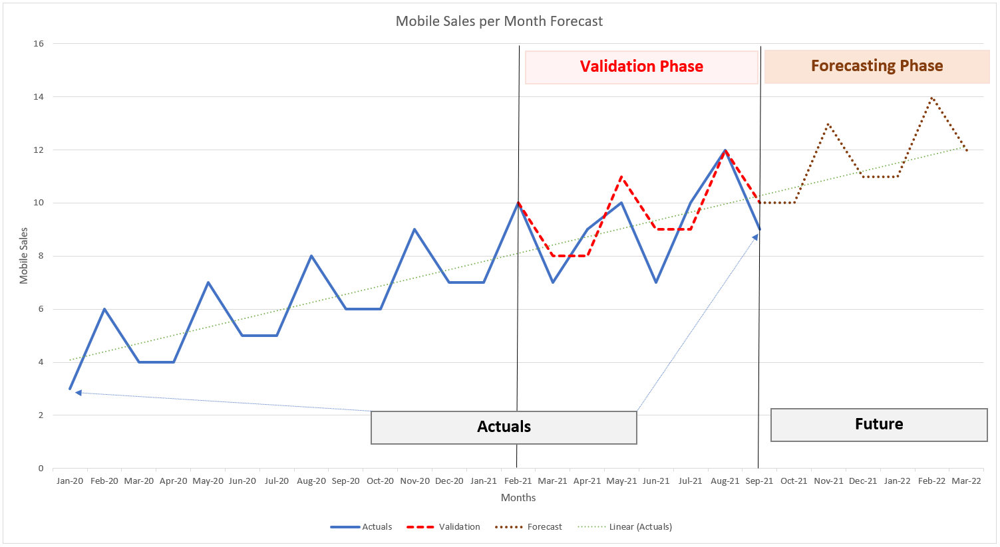

In [1]:
### Graphical Time Series

import os
from IPython.display import Image
PATH = "F:\\Github\\Python tutorials\\Time Series\\"
Image(filename = PATH + "Time Series.png", width=900, height=900)

### 2. Importing / Installing packages

In [3]:
# Packages / libraries
import os #provides functions for interacting with the operating system
import numpy as np 
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

%matplotlib inline

# To install sklearn type "pip install numpy scipy scikit-learn" to the anaconda terminal

# To change scientific numbers to float
np.set_printoptions(formatter={'float_kind':'{:f}'.format})

# Increases the size of sns plots
sns.set(rc={'figure.figsize':(8,6)})

#ARIMA
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn import linear_model

import pmdarima as pm
from pmdarima.model_selection import train_test_split

from fbprophet import Prophet

from pandas import to_datetime

import itertools
import warnings

import datetime
from datetime import datetime
warnings.filterwarnings('ignore')

# installing auto arima
# pip install --user pmdarima

# installing fbprophet
# pip install --user fbprophet
# !pip install --upgrade plotly

### 3. Problem Formulation - What are we trying to solve?

- We want to forecast the GDP per Capita per country for the next 7 to 10 years

### 4.1 Reading / Loading the Raw Data into Python from SQL

In [4]:
#################################################################################################################
##############################   Getting the file from SQL Server      ##########################################
#################################################################################################################

import pypyodbc as podbc

conn2 = podbc.connect("Driver={SQL Server Native Client 11.0};"
                     "Server=DESKTOP-8L98FK0\MSSQLSERVER09;"
                     "Database=Data360YP;"
                     "Trusted_Connection=yes;")

# rynning the SQL quey i need
SQL_Query = pd.read_sql_query('''SELECT * FROM [dbo].[Raw_Data_GDP]''', conn2)

#conn.close()

# print the shape
print(SQL_Query.shape)

# Viz
SQL_Query.head()

(270038, 8)


,demo_ind,indicator,location,country,time,value,flag codes,flags
0,SP_DYN_TFRT_IN,"Fertility rate, total (births per woman)",AUS,Australia,1970,2.86,None,None
1,SP_DYN_TFRT_IN,"Fertility rate, total (births per woman)",AUS,Australia,1971,2.96,None,None
2,SP_DYN_TFRT_IN,"Fertility rate, total (births per woman)",AUS,Australia,1972,2.74,None,None
3,SP_DYN_TFRT_IN,"Fertility rate, total (births per woman)",AUS,Australia,1973,2.49,None,None
4,SP_DYN_TFRT_IN,"Fertility rate, total (births per woman)",AUS,Australia,1974,2.40,None,None


### 4.2 Reading / Loading the Raw Data into Python From CSV

In [5]:
#################################################################################################################
################################ Getting the file from local CSV      ###########################################
#################################################################################################################

# Loading the data
raw_data = pd.read_csv('F:\\Github\Python tutorials\\Time Series\\gdp_raw_data.csv', encoding='latin-1')

# print the shape
print(raw_data.shape)

#runs the first 5 rows
raw_data.head()

(270038, 8)


,demo_ind,indicator,location,country,time,value,flag codes,flags
0,SP_DYN_TFRT_IN,"Fertility rate, total (births per woman)",AUS,Australia,1970,2.86,NaN,NaN
1,SP_DYN_TFRT_IN,"Fertility rate, total (births per woman)",AUS,Australia,1971,2.96,NaN,NaN
2,SP_DYN_TFRT_IN,"Fertility rate, total (births per woman)",AUS,Australia,1972,2.74,NaN,NaN
3,SP_DYN_TFRT_IN,"Fertility rate, total (births per woman)",AUS,Australia,1973,2.49,NaN,NaN
4,SP_DYN_TFRT_IN,"Fertility rate, total (births per woman)",AUS,Australia,1974,2.40,NaN,NaN


### 5. Data Pre-Processing Phase

In [6]:
# Checking for null values
SQL_Query.isnull().sum()

demo_ind           0
indicator          0
location           0
country            0
time               0
value           2066
flag codes    267972
flags         267972
dtype: int64

In [7]:
SQL_Query['indicator'][SQL_Query['value'].isnull()].unique()

array(['Population growth (annual %)',
       'Rural population (% of total population)',
       'GDP deflator (base year varies by country)',
       'GDP growth (annual %)',
       'Poverty headcount ratio at $1.90 a day (PPP) (% of population)',
       'PPP conversion factor, GDP (LCU per international $)',
       'Total debt service (% of GNI)', 'GNI per capita (current LCU)',
       'Official exchange rate (LCU per US$, period average)',
       'GDP per capita (current LCU)',
       'PPP conversion factor, private consumption (LCU per international $)',
       'DEC alternative conversion factor (LCU per US$)'], dtype=object)

In [8]:
# Deleting the NULL values
SQL_Query = SQL_Query.dropna(subset = ['value'])

# filtering out the last 2 columns
SQL_Query = SQL_Query[['demo_ind','indicator','location','country','time','value']]

# Checking for null values
SQL_Query.isnull().sum()

demo_ind     0
indicator    0
location     0
country      0
time         0
value        0
dtype: int64

In [9]:
# Investigate all the elements whithin each Feature 

for column in SQL_Query:
    unique_vals = np.unique(SQL_Query[column])
    nr_values = len(unique_vals)
    if nr_values < 36:
        print('The number of values for feature {} :{} -- {}'.format(column, nr_values,unique_vals))
    else:
        print('The number of values for feature {} :{}'.format(column, nr_values))

The number of values for feature demo_ind :35 -- ['200101' '200144' '200151' '200343' '200345' 'DT_TDS_DECT_GN_ZS'
 'NY_GDP_DEFL_ZS' 'NY_GDP_MKTP_CD' 'NY_GDP_MKTP_CN' 'NY_GDP_MKTP_KD'
 'NY_GDP_MKTP_KD_ZG' 'NY_GDP_MKTP_KN' 'NY_GDP_MKTP_PP_CD'
 'NY_GDP_MKTP_PP_KD' 'NY_GDP_PCAP_CD' 'NY_GDP_PCAP_CN' 'NY_GDP_PCAP_PP_CD'
 'NY_GDP_PCAP_PP_KD' 'NY_GNP_MKTP_CN' 'NY_GNP_PCAP_CD' 'NY_GNP_PCAP_CN'
 'NY_GNP_PCAP_PP_CD' 'PA_NUS_ATLS' 'PA_NUS_FCRF' 'PA_NUS_PPP'
 'PA_NUS_PPPC_RF' 'PA_NUS_PRVT_PP' 'SH_DYN_AIDS_ZS' 'SI_POV_DDAY'
 'SP_DYN_IMRT_IN' 'SP_DYN_LE00_IN' 'SP_DYN_TFRT_IN' 'SP_POP_GROW'
 'SP_RUR_TOTL_ZS' 'XTGOV_IMF']
The number of values for feature indicator :35 -- ['DEC alternative conversion factor (LCU per US$)'
 'Fertility rate, total (births per woman)' 'GDP (constant LCU)'
 'GDP (current LCU)' 'GDP (current US$)'
 'GDP at market prices (constant 2010 US$)'
 'GDP deflator (base year varies by country)' 'GDP growth (annual %)'
 'GDP per capita (current LCU)' 'GDP per capita (current US$)'
 '

In [10]:
# Filtering out the data we need - GDP per Capita
forecast_data = SQL_Query[SQL_Query['indicator'] == 'GDP per capita, PPP (current international $)']

forecast_data = forecast_data[~forecast_data['country'].isin(['Djibouti', 'South Sudan', 'Curaþao', 'Eritrea', 'Bermuda', 'Venezuela (Bolivarian Republic of)'])]

forecast_data.head()

,demo_ind,indicator,location,country,time,value
76848,NY_GDP_PCAP_PP_CD,"GDP per capita, PPP (current international $)",AUS,Australia,1990,17333.10
76849,NY_GDP_PCAP_PP_CD,"GDP per capita, PPP (current international $)",AUS,Australia,1991,17793.60
76850,NY_GDP_PCAP_PP_CD,"GDP per capita, PPP (current international $)",AUS,Australia,1992,18189.34
76851,NY_GDP_PCAP_PP_CD,"GDP per capita, PPP (current international $)",AUS,Australia,1993,19130.89
76852,NY_GDP_PCAP_PP_CD,"GDP per capita, PPP (current international $)",AUS,Australia,1994,20063.81


In [11]:
# Limiting the columns we need
forecast_data = forecast_data[['country','time','value']]
forecast_data.head()

,country,time,value
76848,Australia,1990,17333.10
76849,Australia,1991,17793.60
76850,Australia,1992,18189.34
76851,Australia,1993,19130.89
76852,Australia,1994,20063.81


In [12]:
# Changing the time to date - Most Time Series Models require date structure
forecast_data['time'] = forecast_data['time'].astype(str) + '-01-01'
forecast_data['time'] = pd.to_datetime(forecast_data['time'])

forecast_data.head()

,country,time,value
76848,Australia,1990-01-01,17333.10
76849,Australia,1991-01-01,17793.60
76850,Australia,1992-01-01,18189.34
76851,Australia,1993-01-01,19130.89
76852,Australia,1994-01-01,20063.81


### 6. Spliting the Raw Data

In [13]:
X_train = forecast_data[forecast_data['time'] < '2012-01-01']
X_valid = forecast_data[forecast_data['time'] >= '2011-01-01']

print('X_train Shape', X_train.shape)
print('X_Valid Shape', X_valid.shape)

X_train['time'].unique()

X_train Shape (3966, 3)
X_Valid Shape (1322, 3)


array(['1990-01-01T00:00:00.000000000', '1991-01-01T00:00:00.000000000',
       '1992-01-01T00:00:00.000000000', '1993-01-01T00:00:00.000000000',
       '1994-01-01T00:00:00.000000000', '1995-01-01T00:00:00.000000000',
       '1996-01-01T00:00:00.000000000', '1997-01-01T00:00:00.000000000',
       '1998-01-01T00:00:00.000000000', '1999-01-01T00:00:00.000000000',
       '2000-01-01T00:00:00.000000000', '2001-01-01T00:00:00.000000000',
       '2002-01-01T00:00:00.000000000', '2003-01-01T00:00:00.000000000',
       '2004-01-01T00:00:00.000000000', '2005-01-01T00:00:00.000000000',
       '2006-01-01T00:00:00.000000000', '2007-01-01T00:00:00.000000000',
       '2008-01-01T00:00:00.000000000', '2009-01-01T00:00:00.000000000',
       '2010-01-01T00:00:00.000000000', '2011-01-01T00:00:00.000000000'],
      dtype='datetime64[ns]')

### 7. Running Arima (Autoregressive Integrated Moving Average) - 1 Country

ARIMA:
- Uses a number of lagged observations of time series to forecast observations

Inputs / Parameters:
- p: the number of lag observations in the model; also known as the lag order (AR)
- d: the number of times that the raw observations are differenced; also known as the degree of differencing (I)
- q: the size of the moving average window; also known as the order of the moving average (MA)

Source / Read more about how it works: https://www.investopedia.com/terms/a/autoregressive-integrated-moving-average-arima.asp


In [14]:
########################################################################################################
####################################### Running ARIMA on Australia #####################################
########################################################################################################

# filtering the train data
au = X_train[X_train['country'] == 'Australia']
au2 = au[['time', 'value']]

#filtering the valid data
au_v = X_valid[X_valid['country'] == 'Australia']
au_v2 = au_v[['time', 'value']]

# set the date into index
au2.set_index('time', inplace=True)
au_v2.set_index('time', inplace=True)

# Setting the Index for 6 years
index_7_years = pd.date_range(au2.index[-1], freq='AS', periods = 7) 

index_7_years

DatetimeIndex(['2011-01-01', '2012-01-01', '2013-01-01', '2014-01-01',
               '2015-01-01', '2016-01-01', '2017-01-01'],
              dtype='datetime64[ns]', freq='AS-JAN')

In [15]:
len(X_train['country'].unique())

189

The MSE of ARIMA is: 1838.1413636212956


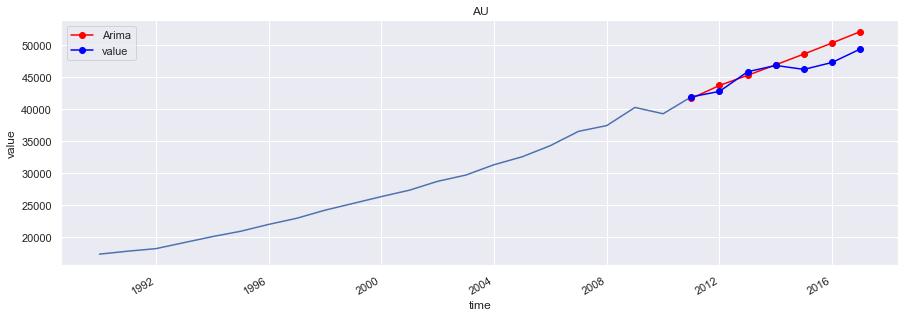

In [16]:
# Running ARIMA with random numbers
model_arima = ARIMA(au2, order=(0,2,3)) # start 2-0-0 and move to the best
model_arima_fit = model_arima.fit(disp=-1)

# Saving ARIMA predictions
fcast1 = model_arima_fit.forecast(7)[0]

# Passing the same index as the others
fcast1 = pd.Series(fcast1, index=index_7_years)
fcast1 = fcast1.rename("Arima") 

# Ploting the predictions
fig, ax = plt.subplots(figsize=(15,5))
chart = sns.lineplot(x='time', y='value', data = au)
chart.set_title('AU')
fcast1.plot(ax=ax, color='red', marker="o", legend=True)
au_v2.plot(ax=ax, color='blue', marker="o", legend=True)

# Printing the AI
print('The MSE of ARIMA is:', mean_squared_error(au_v['value'].values, fcast1.values, squared=False))

In [17]:
###### Option 1: Finding the best value for ARIMA

import itertools
p=d=q=range(0,5)
pdq = list(itertools.product(p,d,q))

for param in pdq:
    try:
        model_arima = ARIMA(au2,order=param)
        model_arima_fit = model_arima.fit()
        print(param,model_arima_fit.aic)
    except:
        continue
    
# The Akaike information criterion (AIC) is an estimator of in-sample prediction error and thereby relative quality of
# statistical models for a given set of data

# It's like the mean squared error in Regression - The smaller the number, the better

(0, 0, 0) 460.0842007079433
(0, 0, 1) 439.3169435354762
(0, 0, 2) 424.29239844537346
(0, 1, 0) 343.29855716475754
(0, 1, 1) 342.1347269787415
(0, 1, 2) 334.76753608318336
(0, 1, 3) 334.11245138211444
(0, 1, 4) 331.3840522148887
(0, 2, 0) 348.12476526480964
(0, 2, 1) 329.9389576555131
(0, 2, 2) 327.9243756676344
(0, 2, 3) 322.2395887106426
(0, 2, 4) nan
(1, 0, 0) 391.58586028672335
(1, 1, 0) 338.7412422866265
(1, 1, 2) 329.21732085575616
(1, 2, 0) 352.5900843899617
(2, 0, 0) 386.74749564285094
(4, 1, 0) 324.1353161978933
(4, 2, 0) 357.0909590136696


The RMSE of auto-arima is: 3484.9681189113


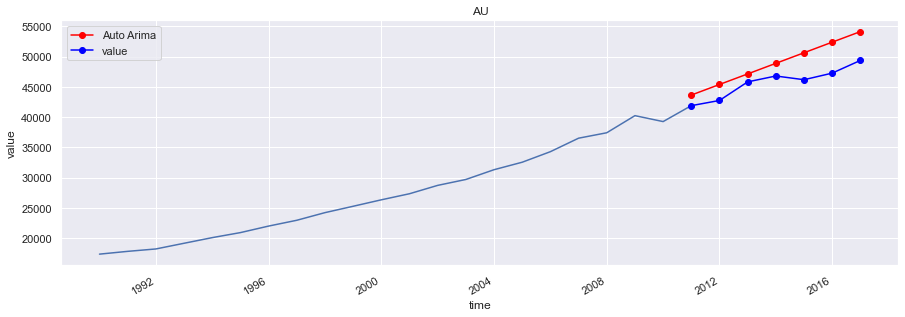

In [18]:
###### Option 2: Auto ARIMA

# Running auto ARIMA 
auto_arima_model = pm.auto_arima(au2, seasonal=False, m=7)

# Read more about setting m
# https://alkaline-ml.com/pmdarima/tips_and_tricks.html

# make your forecasts
fcast2 = auto_arima_model.predict(7) 
fcast2 = pd.Series(fcast2, index=index_7_years)
fcast2 = fcast2.rename("Auto Arima")

# Ploting the predictions
fig, ax = plt.subplots(figsize=(15,5))
chart = sns.lineplot(x='time', y='value', data = au)
chart.set_title('AU')
fcast2.plot(ax=ax, color='red', marker="o", legend=True)
au_v2.plot(ax=ax, color='blue', marker="o", legend=True)

# Printing the AI
print('The RMSE of auto-arima is:', mean_squared_error(au_v['value'].values, fcast2.values, squared=False))

In [19]:
# Conclusion: Run Both

### 8. Running Prophet

- Prophet is open source software released by Facebook’s Core Data Science team

- Prophet is a procedure for forecasting time series data based on an additive model where non-linear trends are fit with yearly, weekly, and daily seasonality

- It works best with time series that have strong seasonal effects and several seasons of historical data. 

- Prophet is robust to missing data and shifts in the trend, and typically handles outliers well.

Source / Read more: https://facebook.github.io/prophet/

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.


The MSE of prophet is: 1188.9836495566044


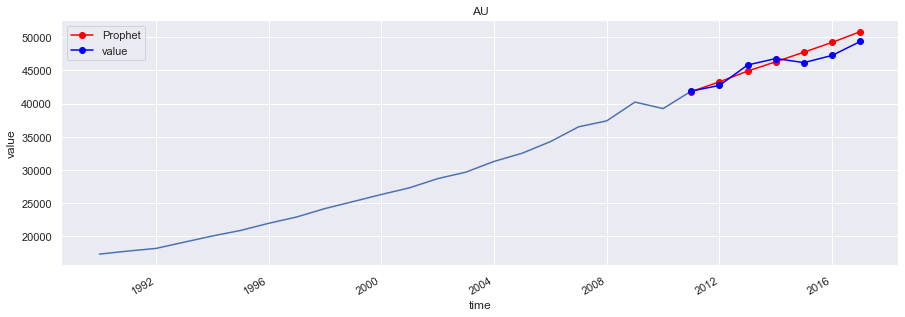

In [20]:
# prepare expected column names
au3 = au.copy()
au3 = au3[['time', 'value']]
au3.columns = ['ds', 'y']
au3['ds']= to_datetime(au3['ds'])

# define the model
model = Prophet()
# fit the model
model.fit(au3)

# define the period for which we want a prediction
df_index_7_years = pd.DataFrame(index_7_years)
df_index_7_years.columns = ['ds']
df_index_7_years['ds']= to_datetime(df_index_7_years['ds'])

# use the model to make a forecast
fcast3 = model.predict(df_index_7_years)
fcast3 = pd.Series(fcast3['yhat'].values, index=index_7_years)
fcast3 = fcast3.rename("Prophet")

# Ploting the predictions
fig, ax = plt.subplots(figsize=(15,5))
chart = sns.lineplot(x='time', y='value', data = au)
chart.set_title('AU')
fcast3.plot(ax=ax, color='red', marker="o", legend=True)
au_v2.plot(ax=ax, color='blue', marker="o", legend=True)

# Printing the AI
print('The MSE of prophet is:', mean_squared_error(au_v['value'].values, fcast3.values, squared=False))

In [21]:
model.predict(df_index_7_years)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2011-01-01,27484.524861,41247.732854,42354.592098,27484.524861,27484.524861,14331.473607,14331.473607,14331.473607,14331.473607,14331.473607,14331.473607,0.0,0.0,0.0,41815.998468
1,2012-01-01,28970.172462,42721.887811,43846.394089,28947.986113,28990.357988,14319.166129,14319.166129,14319.166129,14319.166129,14319.166129,14319.166129,0.0,0.0,0.0,43289.338590
2,2013-01-01,30459.890329,44323.215631,45460.738551,30375.993738,30544.754539,14452.557600,14452.557600,14452.557600,14452.557600,14452.557600,14452.557600,0.0,0.0,0.0,44912.447929
3,2014-01-01,31945.537929,45719.922026,46897.796011,31782.409956,32108.388263,14375.824832,14375.824832,14375.824832,14375.824832,14375.824832,14375.824832,0.0,0.0,0.0,46321.362761
4,2015-01-01,33431.185530,47151.788534,48360.330342,33184.968575,33686.280367,14331.473607,14331.473607,14331.473607,14331.473607,14331.473607,14331.473607,0.0,0.0,0.0,47762.659136
5,2016-01-01,34916.833130,48567.123910,49960.225879,34560.010550,35298.423238,14319.166129,14319.166129,14319.166129,14319.166129,14319.166129,14319.166129,0.0,0.0,0.0,49235.999259
6,2017-01-01,36406.550998,50116.920020,51617.536088,35899.816328,36900.776457,14452.557600,14452.557600,14452.557600,14452.557600,14452.557600,14452.557600,0.0,0.0,0.0,50859.108597


### 9. Running all Time Series Models Together

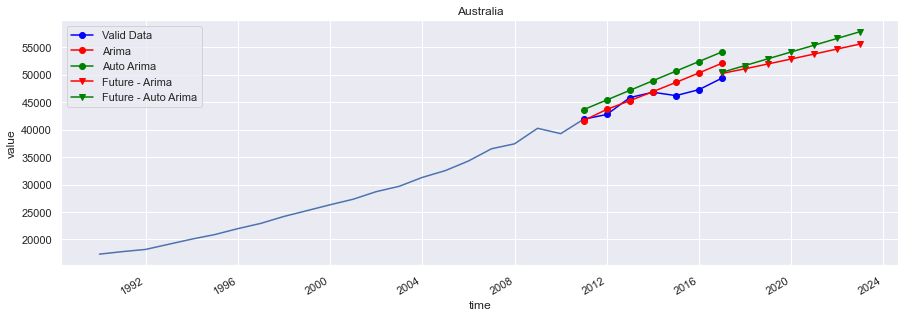

In [22]:
# Step 1 - Arima & Auto-Arima

# creating a country list
countries = forecast_data['country'].unique()

countries = ['Australia']

for c in countries:
    # filtering the train data
    train_data = X_train[X_train['country'] == c] # 3 columns
    train_data2 = train_data[['time', 'value']] # 2 columns
    
    # filtering the valid data
    valid_data = X_valid[X_valid['country'] == c]
    valid_data2 = valid_data[['time', 'value']]
    
    # all data
    all_data = forecast_data[forecast_data['country']==c]
    all_data2 = all_data[['time', 'value']]
    
    #convert date column to datetime
    train_data2.set_index('time', inplace=True)
    valid_data2.set_index('time', inplace=True)
    valid_data2.columns = ['Valid Data']    
    all_data2.set_index('time', inplace=True)
    

    # Setting the Valid - Index for 7 years
    index_7_years = pd.date_range(train_data2.index[-1], freq='AS', periods = 7) 
    
    # Setting the Future - Index for 7 years
    future_index_7_years = pd.date_range(valid_data2.index[-1], freq='AS', periods = 7) 
    
    # Dropping all tables
    try:
        del t_fcast1
        del t_fcast2
        #del t_fcast3
        
        del f_fcast1
        del f_fcast2
        #del f_fcast3       
        
    except:
        print("")

    try:
        del df_fcast1
        del df_fcast2
        del df_fcast3
    except:
        print("")
        
    ##############################################################################################################
    ######################################            ARIMA             ##########################################  
    ##############################################################################################################
    
    # THIS IS FOR THE VALIDATION PHASE 
    try:        
        try:
            # Running ARIMA on Best parameter
            model_arima = ARIMA(train_data2, order=(0,2,3))
            model_arima_fit = model_arima.fit(disp=-1)

            # Saving ARIMA predictions
            t_fcast1 = model_arima_fit.forecast(7)[0]
            # Passing the same index as the others
            t_fcast1 = pd.Series(t_fcast1, index=index_7_years)
            t_fcast1 = t_fcast1.rename("Arima") 
        except:
            # Running ARIMA on Best parameter
            model_arima = ARIMA(train_data2, order=(4,1,1))
            model_arima_fit = model_arima.fit(disp=-1)

            # Saving ARIMA predictions
            t_fcast1 = model_arima_fit.forecast(7)[0]
            # Passing the same index as the others
            t_fcast1 = pd.Series(t_fcast1, index=index_7_years)
            t_fcast1 = t_fcast1.rename("Arima") 
    except:
        print(c, "Arima Train Error")
        
     # THIS IS FOR THE FUTURE PHASE
    try:        
        try:
            # Running ARIMA on Best parameter
            model_arima = ARIMA(all_data2, order=(0,2,3))
            model_arima_fit = model_arima.fit(disp=-1)

            # Saving ARIMA predictions
            f_fcast1 = model_arima_fit.forecast(7)[0]
            # Passing the same index as the others
            f_fcast1 = pd.Series(f_fcast1, index=future_index_7_years)
            f_fcast1 = f_fcast1.rename("Future - Arima") 
        except:
            # Running ARIMA on Best parameter
            model_arima = ARIMA(all_data2, order=(4,1,0))
            model_arima_fit = model_arima.fit(disp=-1)

            # Saving ARIMA predictions
            f_fcast1 = model_arima_fit.forecast(7)[0]
            # Passing the same index as the others
            f_fcast1 = pd.Series(f_fcast1, index=future_index_7_years)
            f_fcast1 = f_fcast1.rename("Future - Arima") 
    except:
        print(c, "Arima Future Error")   
        
    ##############################################################################################################
    ######################################      AUTO - ARIMA             ######################################### 
    ##############################################################################################################
    
    # THIS IS FOR THE VALIDATION PHASE
    try:
        # Running auto ARIMA 
        auto_arima_model = pm.auto_arima(train_data2, seasonal=False, m=7)

        # make your forecasts
        t_fcast2 = auto_arima_model.predict(7) 
        t_fcast2 = pd.Series(t_fcast2, index=index_7_years)
        t_fcast2 = t_fcast2.rename("Auto Arima")

    except:
        print(c, "Auto Arima Train Error") 
        
     # THIS IS FOR THE FUTURE PHASE
    try:
        # Running auto ARIMA Future
        auto_arima_model = pm.auto_arima(all_data2, seasonal=False, m=7)

        # make your forecasts
        f_fcast2 = auto_arima_model.predict(7) 
        f_fcast2 = pd.Series(f_fcast2, index=future_index_7_years)
        f_fcast2 = f_fcast2.rename("Future - Auto Arima")

    except:
        print(c, "Auto Arima Future Error")  
        
    ##############################################################################################################
    ########################################      PLOTTING              ##########################################
    ##############################################################################################################
    
    fig, ax = plt.subplots(figsize=(15,5))
    chart = sns.lineplot(x='time', y='value', data = train_data)
    chart.set_title(c)
    valid_data2.plot(ax=ax, color='blue', marker="o", legend=True)
    # ploting validation
    try:
        t_fcast1.plot(ax=ax, color='red', marker="o", legend=True)
    except:
        print("")        
    try:
        t_fcast2.plot(ax=ax, color='green', marker="o", legend=True)
    except:
        print("")
        
    # plotting future
    try:
        f_fcast1.plot(ax=ax, color='red', marker="v", legend=True)
    except:
        print("")        
    try:
        f_fcast2.plot(ax=ax, color='green', marker="v", legend=True)
    except:
        print("")    
    

In [23]:
future_index_7_years

DatetimeIndex(['2017-01-01', '2018-01-01', '2019-01-01', '2020-01-01',
               '2021-01-01', '2022-01-01', '2023-01-01'],
              dtype='datetime64[ns]', freq='AS-JAN')

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


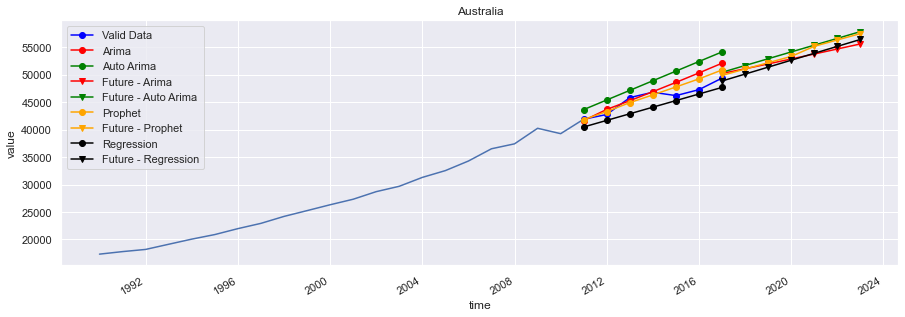

In [24]:
# Step 2 - Adding Prophet and Regression

# creating a country list
countries = forecast_data['country'].unique()

countries = ['Australia']

for c in countries:
    # filtering the train data
    train_data = X_train[X_train['country'] == c]
    train_data2 = train_data[['time', 'value']]
    
    # filtering the valid data
    valid_data = X_valid[X_valid['country'] == c]
    valid_data2 = valid_data[['time', 'value']]
    
    # all data
    all_data = forecast_data[forecast_data['country']==c]
    all_data2 = all_data[['time', 'value']]
    
    #convert date column to datetime
    train_data2.set_index('time', inplace=True)
    valid_data2.set_index('time', inplace=True)
    valid_data2.columns = ['Valid Data']    
    all_data2.set_index('time', inplace=True)
    

    # Setting the Valid - Index for 7 years
    index_7_years = pd.date_range(train_data2.index[-1], freq='AS', periods = 7) 
    
    # Setting the Future - Index for 7 years
    future_index_7_years = pd.date_range(valid_data2.index[-1], freq='AS', periods = 7) 
    
    # Dropping all tables
    try:
        del t_fcast1
        del t_fcast2
        del t_fcast3
        del t_fcast4
        
        del f_fcast1
        del f_fcast2
        del f_fcast3       
        del f_fcast4
        
    except:
        print("")

    try:
        del df_fcast1
        del df_fcast2
        del df_fcast3
    except:
        print("")
        
    ##############################################################################################################
    ######################################            ARIMA             ##########################################  
    ##############################################################################################################
    
    # THIS IS FOR THE VALIDATION PHASE 
    try:        
        try:
            # Running ARIMA on Best parameter
            model_arima = ARIMA(train_data2, order=(0,2,3))
            model_arima_fit = model_arima.fit(disp=-1)

            # Saving ARIMA predictions
            t_fcast1 = model_arima_fit.forecast(7)[0]
            # Passing the same index as the others
            t_fcast1 = pd.Series(t_fcast1, index=index_7_years)
            t_fcast1 = t_fcast1.rename("Arima") 
        except:
            # Running ARIMA on Best parameter
            model_arima = ARIMA(train_data2, order=(4,1,0))
            model_arima_fit = model_arima.fit(disp=-1)

            # Saving ARIMA predictions
            t_fcast1 = model_arima_fit.forecast(7)[0]
            # Passing the same index as the others
            t_fcast1 = pd.Series(t_fcast1, index=index_7_years)
            t_fcast1 = t_fcast1.rename("Arima") 
    except:
        print(c, "Arima Train Error")
        
     # THIS IS FOR THE FUTURE PHASE
    try:        
        try:
            # Running ARIMA on Best parameter
            model_arima = ARIMA(all_data2, order=(0,2,3))
            model_arima_fit = model_arima.fit(disp=-1)

            # Saving ARIMA predictions
            f_fcast1 = model_arima_fit.forecast(7)[0]
            # Passing the same index as the others
            f_fcast1 = pd.Series(f_fcast1, index=future_index_7_years)
            f_fcast1 = f_fcast1.rename("Future - Arima") 
        except:
            # Running ARIMA on Best parameter
            model_arima = ARIMA(all_data2, order=(4,1,0))
            model_arima_fit = model_arima.fit(disp=-1)

            # Saving ARIMA predictions
            f_fcast1 = model_arima_fit.forecast(7)[0]
            # Passing the same index as the others
            f_fcast1 = pd.Series(f_fcast1, index=future_index_7_years)
            f_fcast1 = f_fcast1.rename("Future - Arima") 
    except:
        print(c, "Arima Future Error")   
        
    ##############################################################################################################
    ######################################      AUTO - ARIMA             ######################################### 
    ##############################################################################################################
    
    # THIS IS FOR THE VALIDATION PHASE
    try:
        # Running auto ARIMA 
        auto_arima_model = pm.auto_arima(train_data2, seasonal=False, m=7)

        # make your forecasts
        t_fcast2 = auto_arima_model.predict(7) 
        t_fcast2 = pd.Series(t_fcast2, index=index_7_years)
        t_fcast2 = t_fcast2.rename("Auto Arima")

    except:
        print(c, "Auto Arima Train Error") 
        
     # THIS IS FOR THE FUTURE PHASE
    try:
        # Running auto ARIMA Future
        auto_arima_model = pm.auto_arima(all_data2, seasonal=False, m=7)

        # make your forecasts
        f_fcast2 = auto_arima_model.predict(7) 
        f_fcast2 = pd.Series(f_fcast2, index=future_index_7_years)
        f_fcast2 = f_fcast2.rename("Future - Auto Arima")

    except:
        print(c, "Auto Arima Train Error")  

    ##############################################################################################################
    ######################################      PROPHET             ############################################## 
    ##############################################################################################################
    
    # prepare expected column names
    train_data3 = train_data.copy()
    train_data3 = train_data3[['time', 'value']]
    train_data3.columns = ['ds', 'y']
    train_data3['ds']= to_datetime(train_data3['ds'])
    
    all_data3 = all_data.copy()
    all_data3 = all_data3[['time', 'value']]
    all_data3.columns = ['ds', 'y']
    all_data3['ds']= to_datetime(all_data3['ds'])

    # define the period for which we want a prediction - Valid
    v_df_index_7_years = pd.DataFrame(index_7_years)
    v_df_index_7_years.columns = ['ds']
    v_df_index_7_years['ds']= to_datetime(v_df_index_7_years['ds'])

    # define the period for which we want a prediction - Future
    f_df_index_7_years = pd.DataFrame(future_index_7_years)
    f_df_index_7_years.columns = ['ds']
    f_df_index_7_years['ds']= to_datetime(f_df_index_7_years['ds'])
    
    ############### THIS IS FOR THE VALIDATION PHASE  ##################

    # define the model
    model = Prophet()
    # fit the model
    model.fit(train_data3)

    # use the model to make a forecast
    t_fcast3 = model.predict(v_df_index_7_years)
    t_fcast3 = pd.Series(t_fcast3['yhat'].values, index=index_7_years)
    t_fcast3 = t_fcast3.rename("Prophet")
    
    ############### THIS IS FOR THE VALIDATION PHASE  ##################

    # define the model
    model2 = Prophet()
    # fit the model
    model2.fit(all_data3)

    # use the model to make a forecast
    f_fcast3 = model2.predict(f_df_index_7_years)
    f_fcast3 = pd.Series(f_fcast3['yhat'].values, index=future_index_7_years)
    f_fcast3 = f_fcast3.rename("Future - Prophet")  

    ##############################################################################################################
    ########################################         Regression         ##########################################
    ##############################################################################################################
    
    # Creating Ordinal Dates
    train_data['MonthNumberOrdinal'] = train_data['time']
    train_data['MonthNumberOrdinal'] = pd.to_datetime(train_data['MonthNumberOrdinal']).map(datetime.toordinal)

    all_data['MonthNumberOrdinal'] = all_data['time']
    all_data['MonthNumberOrdinal'] = pd.to_datetime(all_data['MonthNumberOrdinal']).map(datetime.toordinal)

    # adding the ordinal dates to the prediction dates
    v_df_index_7_years['ForecastDate_Ordinal'] = pd.to_datetime(v_df_index_7_years['ds']).map(datetime.toordinal)
    f_df_index_7_years['ForecastDate_Ordinal'] = pd.to_datetime(f_df_index_7_years['ds']).map(datetime.toordinal)


    # Fitting LR on Valid
    reg = linear_model.LinearRegression()
    reg.fit(train_data['MonthNumberOrdinal'].values.reshape(-1, 1), train_data['value'].values)

    # Making predictions
    t_fcast4 = reg.predict(v_df_index_7_years['ForecastDate_Ordinal'].values.reshape(-1, 1))

    # Passing the same index as the others
    t_fcast4 = pd.Series(t_fcast4, index=index_7_years)
    t_fcast4 = t_fcast4.rename("Regression")

    # Fitting LR on Future
    reg2 = linear_model.LinearRegression()
    reg2.fit(all_data['MonthNumberOrdinal'].values.reshape(-1, 1), all_data['value'].values)

    # Making predictions
    f_fcast4 = reg2.predict(f_df_index_7_years['ForecastDate_Ordinal'].values.reshape(-1, 1))

    # Passing the same index as the others
    f_fcast4 = pd.Series(f_fcast4, index=future_index_7_years)
    f_fcast4 = f_fcast4.rename("Future - Regression")
    
    ##############################################################################################################
    ########################################      SAVING THE MSE        ##########################################
    ##############################################################################################################
    
    t_fcast1_mse = mean_squared_error(valid_data['value'].values, t_fcast1.values, squared=False)
    t_fcast2_mse = mean_squared_error(valid_data['value'].values, t_fcast2.values, squared=False)
    t_fcast3_mse = mean_squared_error(valid_data['value'].values, t_fcast3.values, squared=False)
    t_fcast4_mse = mean_squared_error(valid_data['value'].values, t_fcast4.values, squared=False)
    
    ##############################################################################################################
    ########################################      PLOTTING              ##########################################
    ##############################################################################################################
    
    fig, ax = plt.subplots(figsize=(15,5))
    chart = sns.lineplot(x='time', y='value', data = train_data)
    chart.set_title(c)
    valid_data2.plot(ax=ax, color='blue', marker="o", legend=True)
    # ploting validation
    try:
        t_fcast1.plot(ax=ax, color='red', marker="o", legend=True)
    except:
        print("")        
    try:
        t_fcast2.plot(ax=ax, color='green', marker="o", legend=True)
    except:
        print("")
        
    # plotting future
    try:
        f_fcast1.plot(ax=ax, color='red', marker="v", legend=True)
    except:
        print("")        
    try:
        f_fcast2.plot(ax=ax, color='green', marker="v", legend=True)
    except:
        print("") 
    
    t_fcast3.plot(ax=ax, color='orange', marker="o", legend=True)
    f_fcast3.plot(ax=ax, color='orange', marker="v", legend=True)
    
    t_fcast4.plot(ax=ax, color='black', marker="o", legend=True)
    f_fcast4.plot(ax=ax, color='black', marker="v", legend=True)    

In [25]:
v_df_index_7_years

,ds,ForecastDate_Ordinal
0,2011-01-01,734138
1,2012-01-01,734503
2,2013-01-01,734869
3,2014-01-01,735234
4,2015-01-01,735599
5,2016-01-01,735964
6,2017-01-01,736330


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


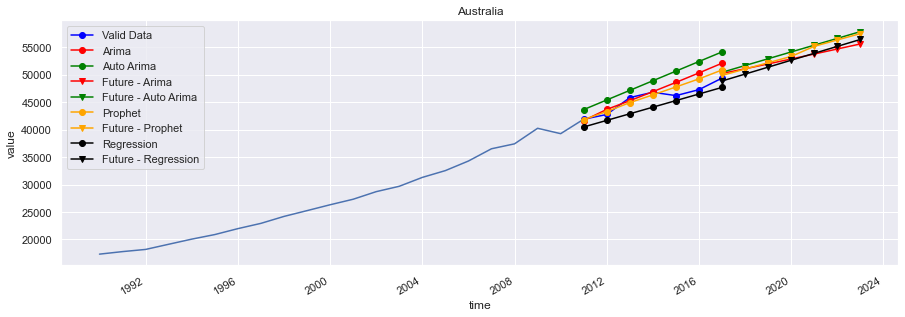

In [26]:
# Step 3 - Saving the results

# creating a country list
countries = forecast_data['country'].unique()

countries = ['Australia']

for c in countries:
    # filtering the train data
    train_data = X_train[X_train['country'] == c]
    train_data2 = train_data[['time', 'value']]
    
    # filtering the valid data
    valid_data = X_valid[X_valid['country'] == c]
    valid_data2 = valid_data[['time', 'value']]
    
    # all data
    all_data = forecast_data[forecast_data['country']==c]
    all_data2 = all_data[['time', 'value']]
    
    #convert date column to datetime
    train_data2.set_index('time', inplace=True)
    valid_data2.set_index('time', inplace=True)
    valid_data2.columns = ['Valid Data']    
    all_data2.set_index('time', inplace=True)
    

    # Setting the Valid - Index for 6 years
    index_7_years = pd.date_range(train_data2.index[-1], freq='AS', periods = 7) 
    
    # Setting the Future - Index for 6 years
    future_index_7_years = pd.date_range(valid_data2.index[-1], freq='AS', periods = 7) 
    
    # Dropping all tables
    try:
        del t_fcast1
        del t_fcast2
        del t_fcast3
        del t_fcast4
        
        del f_fcast1
        del f_fcast2
        del f_fcast3 
        del f_fcast4
        
    except:
        print("")

    try:
        del df_fcast1
        del df_fcast2
        del df_fcast3
        del df_fcast4
    except:
        print("")
        
    ##############################################################################################################
    ######################################            ARIMA             ##########################################  
    ##############################################################################################################
    
    # THIS IS FOR THE VALIDATION PHASE 
    try:        
        try:
            # Running ARIMA on Best parameter
            model_arima = ARIMA(train_data2, order=(0,2,3))
            model_arima_fit = model_arima.fit(disp=-1)

            # Saving ARIMA predictions
            t_fcast1 = model_arima_fit.forecast(7)[0]
            # Passing the same index as the others
            t_fcast1 = pd.Series(t_fcast1, index=index_7_years)
            t_fcast1 = t_fcast1.rename("Arima") 
        except:
            # Running ARIMA on Best parameter
            model_arima = ARIMA(train_data2, order=(4,1,0))
            model_arima_fit = model_arima.fit(disp=-1)

            # Saving ARIMA predictions
            t_fcast1 = model_arima_fit.forecast(7)[0]
            # Passing the same index as the others
            t_fcast1 = pd.Series(t_fcast1, index=index_7_years)
            t_fcast1 = t_fcast1.rename("Arima") 
    except:
        print(c, "Arima Train Error")
        
     # THIS IS FOR THE FUTURE PHASE
    try:        
        try:
            # Running ARIMA on Best parameter
            model_arima = ARIMA(all_data2, order=(0,2,3))
            model_arima_fit = model_arima.fit(disp=-1)

            # Saving ARIMA predictions
            f_fcast1 = model_arima_fit.forecast(7)[0]
            # Passing the same index as the others
            f_fcast1 = pd.Series(f_fcast1, index=future_index_7_years)
            f_fcast1 = f_fcast1.rename("Future - Arima") 
        except:
            # Running ARIMA on Best parameter
            model_arima = ARIMA(all_data2, order=(4,1,0))
            model_arima_fit = model_arima.fit(disp=-1)

            # Saving ARIMA predictions
            f_fcast1 = model_arima_fit.forecast(7)[0]
            # Passing the same index as the others
            f_fcast1 = pd.Series(f_fcast1, index=future_index_7_years)
            f_fcast1 = f_fcast1.rename("Future - Arima") 
    except:
        print(c, "Arima Future Error")   
        
    ##############################################################################################################
    ######################################      AUTO - ARIMA             ######################################### 
    ##############################################################################################################
    
    # THIS IS FOR THE VALIDATION PHASE
    try:
        # Running auto ARIMA 
        auto_arima_model = pm.auto_arima(train_data2, seasonal=False, m=7)

        # make your forecasts
        t_fcast2 = auto_arima_model.predict(7) 
        t_fcast2 = pd.Series(t_fcast2, index=index_7_years)
        t_fcast2 = t_fcast2.rename("Auto Arima")

    except:
        print(c, "Auto Arima Train Error") 
        
     # THIS IS FOR THE FUTURE PHASE
    try:
        # Running auto ARIMA Future
        auto_arima_model = pm.auto_arima(all_data2, seasonal=False, m=7)

        # make your forecasts
        f_fcast2 = auto_arima_model.predict(7) 
        f_fcast2 = pd.Series(f_fcast2, index=future_index_7_years)
        f_fcast2 = f_fcast2.rename("Future - Auto Arima")

    except:
        print(c, "Auto Arima Train Error")  

    ##############################################################################################################
    ######################################      PROPHET             ############################################## 
    ##############################################################################################################
    
    # prepare expected column names
    train_data3 = train_data.copy()
    train_data3 = train_data3[['time', 'value']]
    train_data3.columns = ['ds', 'y']
    train_data3['ds']= to_datetime(train_data3['ds'])
    
    all_data3 = all_data.copy()
    all_data3 = all_data3[['time', 'value']]
    all_data3.columns = ['ds', 'y']
    all_data3['ds']= to_datetime(all_data3['ds'])

    # define the period for which we want a prediction - Valid
    v_df_index_7_years = pd.DataFrame(index_7_years)
    v_df_index_7_years.columns = ['ds']
    v_df_index_7_years['ds']= to_datetime(v_df_index_7_years['ds'])

    # define the period for which we want a prediction - Future
    f_df_index_7_years = pd.DataFrame(future_index_7_years)
    f_df_index_7_years.columns = ['ds']
    f_df_index_7_years['ds']= to_datetime(f_df_index_7_years['ds'])
    
    ############### THIS IS FOR THE VALIDATION PHASE  ##################

    # define the model
    model = Prophet()
    # fit the model
    model.fit(train_data3)

    # use the model to make a forecast
    t_fcast3 = model.predict(v_df_index_7_years)
    t_fcast3 = pd.Series(t_fcast3['yhat'].values, index=index_7_years)
    t_fcast3 = t_fcast3.rename("Prophet")
    
    ############### THIS IS FOR THE VALIDATION PHASE  ##################

    # define the model
    model2 = Prophet()
    # fit the model
    model2.fit(all_data3)

    # use the model to make a forecast
    f_fcast3 = model2.predict(f_df_index_7_years)
    f_fcast3 = pd.Series(f_fcast3['yhat'].values, index=future_index_7_years)
    f_fcast3 = f_fcast3.rename("Future - Prophet")  

    ##############################################################################################################
    ########################################         Regression         ##########################################
    ##############################################################################################################
    
    # Creating Ordinal Dates
    train_data['MonthNumberOrdinal'] = train_data['time']
    train_data['MonthNumberOrdinal'] = pd.to_datetime(train_data['MonthNumberOrdinal']).map(datetime.toordinal)

    all_data['MonthNumberOrdinal'] = all_data['time']
    all_data['MonthNumberOrdinal'] = pd.to_datetime(all_data['MonthNumberOrdinal']).map(datetime.toordinal)

    # adding the ordinal dates to the prediction dates
    v_df_index_7_years['ForecastDate_Ordinal'] = pd.to_datetime(v_df_index_7_years['ds']).map(datetime.toordinal)
    f_df_index_7_years['ForecastDate_Ordinal'] = pd.to_datetime(f_df_index_7_years['ds']).map(datetime.toordinal)


    # Fitting LR on Valid
    reg = linear_model.LinearRegression()
    reg.fit(train_data['MonthNumberOrdinal'].values.reshape(-1, 1), train_data['value'].values)

    # Making predictions
    t_fcast4 = reg.predict(v_df_index_7_years['ForecastDate_Ordinal'].values.reshape(-1, 1))

    # Passing the same index as the others
    t_fcast4 = pd.Series(t_fcast4, index=index_7_years)
    t_fcast4 = t_fcast4.rename("Regression")

    # Fitting LR on Future
    reg2 = linear_model.LinearRegression()
    reg2.fit(all_data['MonthNumberOrdinal'].values.reshape(-1, 1), all_data['value'].values)

    # Making predictions
    f_fcast4 = reg2.predict(f_df_index_7_years['ForecastDate_Ordinal'].values.reshape(-1, 1))

    # Passing the same index as the others
    f_fcast4 = pd.Series(f_fcast4, index=future_index_7_years)
    f_fcast4 = f_fcast4.rename("Future - Regression")
    
    ##############################################################################################################
    ########################################      SAVING THE MSE        ##########################################
    ##############################################################################################################
    
    t_fcast1_mse = mean_squared_error(valid_data['value'].values, t_fcast1.values, squared=False)
    t_fcast2_mse = mean_squared_error(valid_data['value'].values, t_fcast2.values, squared=False)
    t_fcast3_mse = mean_squared_error(valid_data['value'].values, t_fcast3.values, squared=False)
    t_fcast4_mse = mean_squared_error(valid_data['value'].values, t_fcast4.values, squared=False)
    
    ##############################################################################################################
    ########################################      PLOTTING              ##########################################
    ##############################################################################################################
    
    fig, ax = plt.subplots(figsize=(15,5))
    chart = sns.lineplot(x='time', y='value', data = train_data)
    chart.set_title(c)
    valid_data2.plot(ax=ax, color='blue', marker="o", legend=True)
    # ploting validation
    try:
        t_fcast1.plot(ax=ax, color='red', marker="o", legend=True)
    except:
        print("")        
    try:
        t_fcast2.plot(ax=ax, color='green', marker="o", legend=True)
    except:
        print("")
        
    # plotting future
    try:
        f_fcast1.plot(ax=ax, color='red', marker="v", legend=True)
    except:
        print("")        
    try:
        f_fcast2.plot(ax=ax, color='green', marker="v", legend=True)
    except:
        print("") 
    
    t_fcast3.plot(ax=ax, color='orange', marker="o", legend=True)
    f_fcast3.plot(ax=ax, color='orange', marker="v", legend=True)
    
    t_fcast4.plot(ax=ax, color='black', marker="o", legend=True)
    f_fcast4.plot(ax=ax, color='black', marker="v", legend=True)  
        
    ##############################################################################################################
    ########################################      SAVING THE RESULTS     #########################################
    ##############################################################################################################
    
    try:
        # Creating a DF for fcast1
        t_fcast1 = t_fcast1.reset_index()
        t_fcast1.columns = ['Date','Arima ForecastValue Validation']

        f_fcast1 = f_fcast1.reset_index()
        f_fcast1.columns = ['Date','Arima ForecastValue Future']

        # Creating the extra columns
        t_fcast1['Arima ForecastValue Future'] = np.nan
        f_fcast1['Arima ForecastValue Validation'] = np.nan

        # reordering 1 only
        t_fcast1 = t_fcast1[['Date','Arima ForecastValue Future','Arima ForecastValue Validation']]

        # Joining them together
        df_fcast1 = pd.concat([t_fcast1, f_fcast1], axis=0)
        df_fcast1['Country'] = c
        df_fcast1['ML Method'] = 'Arima'
        df_fcast1['Arima MSE'] = t_fcast1_mse
    
    except:
        df_fcast1 = pd.DataFrame({'Date': [np.nan], 'Arima ForecastValue Future': [np.nan],'Arima ForecastValue Validation': [np.nan], 'Country':[c], 'ML Method':['Arima'], 'Arima MSE':[np.nan]})

    try:
        # Creating a DF for fcast2
        t_fcast2 = t_fcast2.reset_index()
        t_fcast2.columns = ['Date','Auto-Arima ForecastValue Validation']

        f_fcast2 = f_fcast2.reset_index()
        f_fcast2.columns = ['Date','Auto-Arima ForecastValue Future']

        # Creating the extra columns
        t_fcast2['Auto-Arima ForecastValue Future'] = np.nan
        f_fcast2['Auto-Arima ForecastValue Validation'] = np.nan

        # reordering 1 only
        t_fcast2 = t_fcast2[['Date','Auto-Arima ForecastValue Future','Auto-Arima ForecastValue Validation']]

        # Joining them together
        df_fcast2 = pd.concat([t_fcast2, f_fcast2], axis=0)
        df_fcast2['Country'] = c
        df_fcast2['ML Method'] = 'Auto-Arima'
        df_fcast2['Auto-Arima MSE'] = t_fcast2_mse
    
    except:
        df_fcast2 = pd.DataFrame({'Date': [np.nan], 'Auto-Arima ForecastValue Future': [np.nan],'Auto-Arima ForecastValue Validation': [np.nan], 'Country':[c], 'ML Method':['Auto-Arima']})
        
    try:
        # Creating a DF for fcast3
        t_fcast3 = t_fcast3.reset_index()
        t_fcast3.columns = ['Date','Prophet ForecastValue Validation']

        f_fcast3 = f_fcast3.reset_index()
        f_fcast3.columns = ['Date','Prophet ForecastValue Future']

        # Creating the extra columns
        t_fcast3['Prophet ForecastValue Future'] = np.nan
        f_fcast3['Prophet ForecastValue Validation'] = np.nan

        # reordering 1 only
        t_fcast3 = t_fcast3[['Date','Prophet ForecastValue Future','Prophet ForecastValue Validation']]

        # Joining them together
        df_fcast3 = pd.concat([t_fcast3, f_fcast3], axis=0)
        df_fcast3['Country'] = c
        df_fcast3['ML Method'] = 'Prophet'
        df_fcast3['Prophet MSE'] = t_fcast3_mse
    
    except:
        df_fcast3 = pd.DataFrame({'Date': [np.nan], 'Prophet ForecastValue Future': [np.nan],'Prophet ForecastValue Validation': [np.nan], 'Country':[c], 'ML Method':['Auto-Arima']})
        
    try:
        # Creating a DF for fcast4
        t_fcast4 = t_fcast4.reset_index()
        t_fcast4.columns = ['Date','Regression ForecastValue Validation']

        f_fcast4 = f_fcast4.reset_index()
        f_fcast4.columns = ['Date','Regression ForecastValue Future']

        # Creating the extra columns
        t_fcast4['Regression ForecastValue Future'] = np.nan
        f_fcast4['Regression ForecastValue Validation'] = np.nan

        # reordering 1 only
        t_fcast4 = t_fcast4[['Date','Regression ForecastValue Future','Regression ForecastValue Validation']]

        # Joining them together
        df_fcast4 = pd.concat([t_fcast4, f_fcast4], axis=0)
        df_fcast4['Country'] = c
        df_fcast4['ML Method'] = 'Regression'
        df_fcast4['Regression MSE'] = t_fcast4_mse
        df_fcast4['Regression Slope'] = reg2.coef_[0]
        df_fcast4['Regression Trend Direction'] = np.where(df_fcast4['Regression Slope']<=0, 'Negative Trend', 'Positive Trend')
        df_fcast4['Regression Slope Monthly Change Proj'] = df_fcast4['Regression ForecastValue Future'].iloc[-1] - df_fcast4['Regression ForecastValue Future'].iloc[-2]
    
    except:
        df_fcast4 = pd.DataFrame({'Date': [np.nan], 'Regression ForecastValue Future': [np.nan],'Regression ForecastValue Validation': [np.nan], 'Country':[c], 'ML Method':['Auto-Arima'], 'Regression Slope':[np.nan], 'Regression Trend Direction':[np.nan], 'Regression Slope Monthly Change Proj':[np.nan]})
        
    # Aggregating the data to avoid duplication
    df_fcast1 = df_fcast1.groupby(['Date', 'Country','ML Method'], as_index = False).agg({'Arima ForecastValue Future':'sum','Arima ForecastValue Validation':'sum','Arima MSE':'max'})
    df_fcast2 = df_fcast2.groupby(['Date', 'Country','ML Method'], as_index = False).agg({'Auto-Arima ForecastValue Future':'sum','Auto-Arima ForecastValue Validation':'sum','Auto-Arima MSE':'max'})
    df_fcast3 = df_fcast3.groupby(['Date', 'Country','ML Method'], as_index = False).agg({'Prophet ForecastValue Future':'sum','Prophet ForecastValue Validation':'sum','Prophet MSE':'max'})
    df_fcast4 = df_fcast4.groupby(['Date', 'Country','ML Method', 'Regression Trend Direction'], as_index = False).agg({'Regression ForecastValue Future':'sum','Regression ForecastValue Validation':'sum','Regression MSE':'max','Regression Slope':'max','Regression Slope Monthly Change Proj':'max'})

    # joining them all together
    all_forecasts = df_fcast1.merge(df_fcast2[['Date','Auto-Arima ForecastValue Future','Auto-Arima ForecastValue Validation', 'Auto-Arima MSE']], how = 'left', on ='Date')
    all_forecasts = all_forecasts.merge(df_fcast3[['Date','Prophet ForecastValue Future', 'Prophet ForecastValue Validation', 'Prophet MSE']], how = 'left', on ='Date')
    all_forecasts = all_forecasts.merge(df_fcast4[['Date','Regression ForecastValue Future', 'Regression ForecastValue Validation', 'Regression MSE', 'Regression Slope','Regression Slope Monthly Change Proj','Regression Trend Direction']], how = 'left', on ='Date')

    # Saving the predictions in a DF
    try:
        final_forecasts = pd.concat([final_forecasts, all_forecasts], ignore_index = True)
    except:
        final_forecasts = all_forecasts    

In [27]:
all_forecasts

,Date,Country,ML Method,Arima ForecastValue Future,Arima ForecastValue Validation,Arima MSE,Auto-Arima ForecastValue Future,Auto-Arima ForecastValue Validation,Auto-Arima MSE,Prophet ForecastValue Future,Prophet ForecastValue Validation,Prophet MSE,Regression ForecastValue Future,Regression ForecastValue Validation,Regression MSE,Regression Slope,Regression Slope Monthly Change Proj,Regression Trend Direction
0,2011-01-01,Australia,Arima,0.000000,41652.373939,1838.141364,0.000000,43644.354078,3484.968119,0.000000,41815.998468,1188.98365,0.000000,40479.487055,1833.553097,3.450056,1259.270378,Positive Trend
1,2012-01-01,Australia,Arima,0.000000,43674.351312,1838.141364,0.000000,45394.538156,3484.968119,0.000000,43289.338590,1188.98365,0.000000,41679.244284,1833.553097,3.450056,1259.270378,Positive Trend
2,2013-01-01,Australia,Arima,0.000000,45269.007007,1838.141364,0.000000,47144.722234,3484.968119,0.000000,44912.447929,1188.98365,0.000000,42882.288519,1833.553097,3.450056,1259.270378,Positive Trend
3,2014-01-01,Australia,Arima,0.000000,46907.950116,1838.141364,0.000000,48894.906312,3484.968119,0.000000,46321.362761,1188.98365,0.000000,44082.045747,1833.553097,3.450056,1259.270378,Positive Trend
4,2015-01-01,Australia,Arima,0.000000,48591.180640,1838.141364,0.000000,50645.090390,3484.968119,0.000000,47762.659136,1188.98365,0.000000,45281.802976,1833.553097,3.450056,1259.270378,Positive Trend
5,2016-01-01,Australia,Arima,0.000000,50318.698578,1838.141364,0.000000,52395.274468,3484.968119,0.000000,49235.999259,1188.98365,0.000000,46481.560205,1833.553097,3.450056,1259.270378,Positive Trend
6,2017-01-01,Australia,Arima,50228.060091,52090.503930,1838.141364,50431.032681,54145.458546,3484.968119,49867.090480,50859.108597,1188.98365,48850.286020,47684.604440,1833.553097,3.450056,1259.270378,Positive Trend
7,2018-01-01,Australia,Arima,51070.715778,0.000000,1838.141364,51665.762118,0.000000,3484.968119,51024.186471,0.000000,1188.98365,50109.556398,0.000000,1833.553097,3.450056,1259.270378,Positive Trend
8,2019-01-01,Australia,Arima,51958.601761,0.000000,1838.141364,52900.491555,0.000000,3484.968119,52174.736426,0.000000,1188.98365,51368.826775,0.000000,1833.553097,3.450056,1259.270378,Positive Trend
9,2020-01-01,Australia,Arima,52854.884366,0.000000,1838.141364,54135.220991,0.000000,3484.968119,53318.889886,0.000000,1188.98365,52628.097153,0.000000,1833.553097,3.450056,1259.270378,Positive Trend


In [28]:
df_fcast2

,Date,Country,ML Method,Auto-Arima ForecastValue Future,Auto-Arima ForecastValue Validation,Auto-Arima MSE
0,2011-01-01,Australia,Auto-Arima,0.000000,43644.354078,3484.968119
1,2012-01-01,Australia,Auto-Arima,0.000000,45394.538156,3484.968119
2,2013-01-01,Australia,Auto-Arima,0.000000,47144.722234,3484.968119
3,2014-01-01,Australia,Auto-Arima,0.000000,48894.906312,3484.968119
4,2015-01-01,Australia,Auto-Arima,0.000000,50645.090390,3484.968119
5,2016-01-01,Australia,Auto-Arima,0.000000,52395.274468,3484.968119
6,2017-01-01,Australia,Auto-Arima,50431.032681,54145.458546,3484.968119
7,2018-01-01,Australia,Auto-Arima,51665.762118,0.000000,3484.968119
8,2019-01-01,Australia,Auto-Arima,52900.491555,0.000000,3484.968119
9,2020-01-01,Australia,Auto-Arima,54135.220991,0.000000,3484.968119


In [29]:
df_fcast1.merge(df_fcast2[['Date','Auto-Arima ForecastValue Future','Auto-Arima ForecastValue Validation', 'Auto-Arima MSE']], how = 'left', on ='Date')

,Date,Country,ML Method,Arima ForecastValue Future,Arima ForecastValue Validation,Arima MSE,Auto-Arima ForecastValue Future,Auto-Arima ForecastValue Validation,Auto-Arima MSE
0,2011-01-01,Australia,Arima,0.000000,41652.373939,1838.141364,0.000000,43644.354078,3484.968119
1,2012-01-01,Australia,Arima,0.000000,43674.351312,1838.141364,0.000000,45394.538156,3484.968119
2,2013-01-01,Australia,Arima,0.000000,45269.007007,1838.141364,0.000000,47144.722234,3484.968119
3,2014-01-01,Australia,Arima,0.000000,46907.950116,1838.141364,0.000000,48894.906312,3484.968119
4,2015-01-01,Australia,Arima,0.000000,48591.180640,1838.141364,0.000000,50645.090390,3484.968119
5,2016-01-01,Australia,Arima,0.000000,50318.698578,1838.141364,0.000000,52395.274468,3484.968119
6,2017-01-01,Australia,Arima,50228.060091,52090.503930,1838.141364,50431.032681,54145.458546,3484.968119
7,2018-01-01,Australia,Arima,51070.715778,0.000000,1838.141364,51665.762118,0.000000,3484.968119
8,2019-01-01,Australia,Arima,51958.601761,0.000000,1838.141364,52900.491555,0.000000,3484.968119
9,2020-01-01,Australia,Arima,52854.884366,0.000000,1838.141364,54135.220991,0.000000,3484.968119


In [30]:
df_fcast1.merge(df_fcast2[['Date','Auto-Arima ForecastValue Future','Auto-Arima ForecastValue Validation', 'Auto-Arima MSE']], how = 'left', on ='Date')

,Date,Country,ML Method,Arima ForecastValue Future,Arima ForecastValue Validation,Arima MSE,Auto-Arima ForecastValue Future,Auto-Arima ForecastValue Validation,Auto-Arima MSE
0,2011-01-01,Australia,Arima,0.000000,41652.373939,1838.141364,0.000000,43644.354078,3484.968119
1,2012-01-01,Australia,Arima,0.000000,43674.351312,1838.141364,0.000000,45394.538156,3484.968119
2,2013-01-01,Australia,Arima,0.000000,45269.007007,1838.141364,0.000000,47144.722234,3484.968119
3,2014-01-01,Australia,Arima,0.000000,46907.950116,1838.141364,0.000000,48894.906312,3484.968119
4,2015-01-01,Australia,Arima,0.000000,48591.180640,1838.141364,0.000000,50645.090390,3484.968119
5,2016-01-01,Australia,Arima,0.000000,50318.698578,1838.141364,0.000000,52395.274468,3484.968119
6,2017-01-01,Australia,Arima,50228.060091,52090.503930,1838.141364,50431.032681,54145.458546,3484.968119
7,2018-01-01,Australia,Arima,51070.715778,0.000000,1838.141364,51665.762118,0.000000,3484.968119
8,2019-01-01,Australia,Arima,51958.601761,0.000000,1838.141364,52900.491555,0.000000,3484.968119
9,2020-01-01,Australia,Arima,52854.884366,0.000000,1838.141364,54135.220991,0.000000,3484.968119


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run

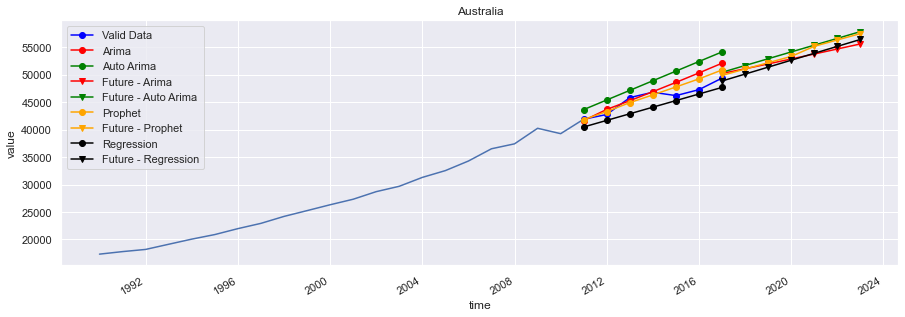

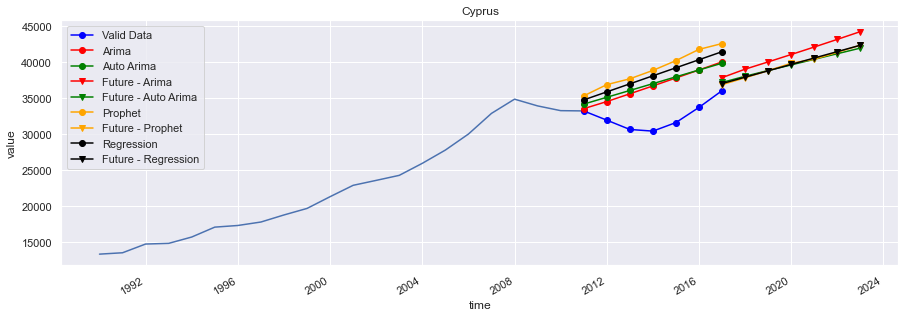

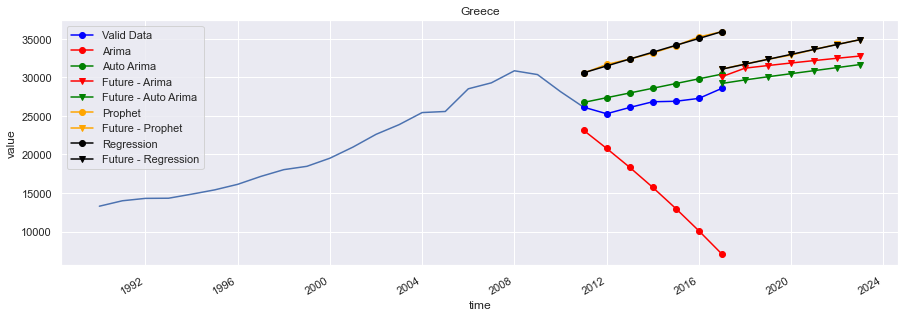

In [31]:
# Step 4 - Testing it on more countries

# creating a country list
countries = forecast_data['country'].unique()

countries = ['Australia', 'Cyprus', 'Greece']

for c in countries:
    # filtering the train data
    train_data = X_train[X_train['country'] == c]
    train_data2 = train_data[['time', 'value']]
    
    # filtering the valid data
    valid_data = X_valid[X_valid['country'] == c]
    valid_data2 = valid_data[['time', 'value']]
    
    # all data
    all_data = forecast_data[forecast_data['country']==c]
    all_data2 = all_data[['time', 'value']]
    
    #convert date column to datetime
    train_data2.set_index('time', inplace=True)
    valid_data2.set_index('time', inplace=True)
    valid_data2.columns = ['Valid Data']    
    all_data2.set_index('time', inplace=True)
    

    # Setting the Valid - Index for 6 years
    index_7_years = pd.date_range(train_data2.index[-1], freq='AS', periods = 7) 
    
    # Setting the Future - Index for 6 years
    future_index_7_years = pd.date_range(valid_data2.index[-1], freq='AS', periods = 7) 
    
    # Dropping all tables
    try:
        del t_fcast1
        del t_fcast2
        del t_fcast3
        del t_fcast4
        
        del f_fcast1
        del f_fcast2
        del f_fcast3 
        del f_fcast4
        
    except:
        print("")

    try:
        del df_fcast1
        del df_fcast2
        del df_fcast3
        del df_fcast4
    except:
        print("")
        
    ##############################################################################################################
    ######################################            ARIMA             ##########################################  
    ##############################################################################################################
    
    # THIS IS FOR THE VALIDATION PHASE 
    try:        
        try:
            # Running ARIMA on Best parameter
            model_arima = ARIMA(train_data2, order=(0,2,3))
            model_arima_fit = model_arima.fit(disp=-1)

            # Saving ARIMA predictions
            t_fcast1 = model_arima_fit.forecast(7)[0]
            # Passing the same index as the others
            t_fcast1 = pd.Series(t_fcast1, index=index_7_years)
            t_fcast1 = t_fcast1.rename("Arima") 
        except:
            # Running ARIMA on Best parameter
            model_arima = ARIMA(train_data2, order=(4,1,0))
            model_arima_fit = model_arima.fit(disp=-1)

            # Saving ARIMA predictions
            t_fcast1 = model_arima_fit.forecast(7)[0]
            # Passing the same index as the others
            t_fcast1 = pd.Series(t_fcast1, index=index_7_years)
            t_fcast1 = t_fcast1.rename("Arima") 
    except:
        print(c, "Arima Train Error")
        
     # THIS IS FOR THE FUTURE PHASE
    try:        
        try:
            # Running ARIMA on Best parameter
            model_arima = ARIMA(all_data2, order=(0,2,3))
            model_arima_fit = model_arima.fit(disp=-1)

            # Saving ARIMA predictions
            f_fcast1 = model_arima_fit.forecast(7)[0]
            # Passing the same index as the others
            f_fcast1 = pd.Series(f_fcast1, index=future_index_7_years)
            f_fcast1 = f_fcast1.rename("Future - Arima") 
        except:
            # Running ARIMA on Best parameter
            model_arima = ARIMA(all_data2, order=(4,1,0))
            model_arima_fit = model_arima.fit(disp=-1)

            # Saving ARIMA predictions
            f_fcast1 = model_arima_fit.forecast(7)[0]
            # Passing the same index as the others
            f_fcast1 = pd.Series(f_fcast1, index=future_index_7_years)
            f_fcast1 = f_fcast1.rename("Future - Arima") 
    except:
        print(c, "Arima Future Error")   
        
    ##############################################################################################################
    ######################################      AUTO - ARIMA             ######################################### 
    ##############################################################################################################
    
    # THIS IS FOR THE VALIDATION PHASE
    try:
        # Running auto ARIMA 
        auto_arima_model = pm.auto_arima(train_data2, seasonal=False, m=7)

        # make your forecasts
        t_fcast2 = auto_arima_model.predict(7) 
        t_fcast2 = pd.Series(t_fcast2, index=index_7_years)
        t_fcast2 = t_fcast2.rename("Auto Arima")

    except:
        print(c, "Auto Arima Train Error") 
        
     # THIS IS FOR THE FUTURE PHASE
    try:
        # Running auto ARIMA Future
        auto_arima_model = pm.auto_arima(all_data2, seasonal=False, m=7)

        # make your forecasts
        f_fcast2 = auto_arima_model.predict(7) 
        f_fcast2 = pd.Series(f_fcast2, index=future_index_7_years)
        f_fcast2 = f_fcast2.rename("Future - Auto Arima")

    except:
        print(c, "Auto Arima Train Error")  

    ##############################################################################################################
    ######################################      PROPHET             ############################################## 
    ##############################################################################################################
    
    # prepare expected column names
    train_data3 = train_data.copy()
    train_data3 = train_data3[['time', 'value']]
    train_data3.columns = ['ds', 'y']
    train_data3['ds']= to_datetime(train_data3['ds'])
    
    all_data3 = all_data.copy()
    all_data3 = all_data3[['time', 'value']]
    all_data3.columns = ['ds', 'y']
    all_data3['ds']= to_datetime(all_data3['ds'])

    # define the period for which we want a prediction - Valid
    v_df_index_7_years = pd.DataFrame(index_7_years)
    v_df_index_7_years.columns = ['ds']
    v_df_index_7_years['ds']= to_datetime(v_df_index_7_years['ds'])

    # define the period for which we want a prediction - Future
    f_df_index_7_years = pd.DataFrame(future_index_7_years)
    f_df_index_7_years.columns = ['ds']
    f_df_index_7_years['ds']= to_datetime(f_df_index_7_years['ds'])
    
    ############### THIS IS FOR THE VALIDATION PHASE  ##################

    # define the model
    model = Prophet()
    # fit the model
    model.fit(train_data3)

    # use the model to make a forecast
    t_fcast3 = model.predict(v_df_index_7_years)
    t_fcast3 = pd.Series(t_fcast3['yhat'].values, index=index_7_years)
    t_fcast3 = t_fcast3.rename("Prophet")
    
    ############### THIS IS FOR THE VALIDATION PHASE  ##################

    # define the model
    model2 = Prophet()
    # fit the model
    model2.fit(all_data3)

    # use the model to make a forecast
    f_fcast3 = model2.predict(f_df_index_7_years)
    f_fcast3 = pd.Series(f_fcast3['yhat'].values, index=future_index_7_years)
    f_fcast3 = f_fcast3.rename("Future - Prophet")  

    ##############################################################################################################
    ########################################         Regression         ##########################################
    ##############################################################################################################
    
    # Creating Ordinal Dates
    train_data['MonthNumberOrdinal'] = train_data['time']
    train_data['MonthNumberOrdinal'] = pd.to_datetime(train_data['MonthNumberOrdinal']).map(datetime.toordinal)

    all_data['MonthNumberOrdinal'] = all_data['time']
    all_data['MonthNumberOrdinal'] = pd.to_datetime(all_data['MonthNumberOrdinal']).map(datetime.toordinal)

    # adding the ordinal dates to the prediction dates
    v_df_index_7_years['ForecastDate_Ordinal'] = pd.to_datetime(v_df_index_7_years['ds']).map(datetime.toordinal)
    f_df_index_7_years['ForecastDate_Ordinal'] = pd.to_datetime(f_df_index_7_years['ds']).map(datetime.toordinal)


    # Fitting LR on Valid
    reg = linear_model.LinearRegression()
    reg.fit(train_data['MonthNumberOrdinal'].values.reshape(-1, 1), train_data['value'].values)

    # Making predictions
    t_fcast4 = reg.predict(v_df_index_7_years['ForecastDate_Ordinal'].values.reshape(-1, 1))

    # Passing the same index as the others
    t_fcast4 = pd.Series(t_fcast4, index=index_7_years)
    t_fcast4 = t_fcast4.rename("Regression")

    # Fitting LR on Future
    reg2 = linear_model.LinearRegression()
    reg2.fit(all_data['MonthNumberOrdinal'].values.reshape(-1, 1), all_data['value'].values)

    # Making predictions
    f_fcast4 = reg2.predict(f_df_index_7_years['ForecastDate_Ordinal'].values.reshape(-1, 1))

    # Passing the same index as the others
    f_fcast4 = pd.Series(f_fcast4, index=future_index_7_years)
    f_fcast4 = f_fcast4.rename("Future - Regression")
    
    ##############################################################################################################
    ########################################      SAVING THE MSE        ##########################################
    ##############################################################################################################
    
    t_fcast1_mse = mean_squared_error(valid_data['value'].values, t_fcast1.values, squared=False)
    t_fcast2_mse = mean_squared_error(valid_data['value'].values, t_fcast2.values, squared=False)
    t_fcast3_mse = mean_squared_error(valid_data['value'].values, t_fcast3.values, squared=False)
    t_fcast4_mse = mean_squared_error(valid_data['value'].values, t_fcast4.values, squared=False)
    
    ##############################################################################################################
    ########################################      PLOTTING              ##########################################
    ##############################################################################################################
    
    fig, ax = plt.subplots(figsize=(15,5))
    chart = sns.lineplot(x='time', y='value', data = train_data)
    chart.set_title(c)
    valid_data2.plot(ax=ax, color='blue', marker="o", legend=True)
    # ploting validation
    try:
        t_fcast1.plot(ax=ax, color='red', marker="o", legend=True)
    except:
        print("")        
    try:
        t_fcast2.plot(ax=ax, color='green', marker="o", legend=True)
    except:
        print("")
        
    # plotting future
    try:
        f_fcast1.plot(ax=ax, color='red', marker="v", legend=True)
    except:
        print("")        
    try:
        f_fcast2.plot(ax=ax, color='green', marker="v", legend=True)
    except:
        print("") 
    
    t_fcast3.plot(ax=ax, color='orange', marker="o", legend=True)
    f_fcast3.plot(ax=ax, color='orange', marker="v", legend=True)
    
    t_fcast4.plot(ax=ax, color='black', marker="o", legend=True)
    f_fcast4.plot(ax=ax, color='black', marker="v", legend=True)  
        
    ##############################################################################################################
    ########################################      SAVING THE RESULTS     #########################################
    ##############################################################################################################
    
    try:
        # Creating a DF for fcast1
        t_fcast1 = t_fcast1.reset_index()
        t_fcast1.columns = ['Date','Arima ForecastValue Validation']

        f_fcast1 = f_fcast1.reset_index()
        f_fcast1.columns = ['Date','Arima ForecastValue Future']

        # Creating the extra columns
        t_fcast1['Arima ForecastValue Future'] = np.nan
        f_fcast1['Arima ForecastValue Validation'] = np.nan

        # reordering 1 only
        t_fcast1 = t_fcast1[['Date','Arima ForecastValue Future','Arima ForecastValue Validation']]

        # Joining them together
        df_fcast1 = pd.concat([t_fcast1, f_fcast1], axis=0)
        df_fcast1['Country'] = c
        df_fcast1['ML Method'] = 'Arima'
        df_fcast1['Arima MSE'] = t_fcast1_mse
    
    except:
        df_fcast1 = pd.DataFrame({'Date': [np.nan], 'Arima ForecastValue Future': [np.nan],'Arima ForecastValue Validation': [np.nan], 'Country':[c], 'ML Method':['Arima']})

    try:
        # Creating a DF for fcast2
        t_fcast2 = t_fcast2.reset_index()
        t_fcast2.columns = ['Date','Auto-Arima ForecastValue Validation']

        f_fcast2 = f_fcast2.reset_index()
        f_fcast2.columns = ['Date','Auto-Arima ForecastValue Future']

        # Creating the extra columns
        t_fcast2['Auto-Arima ForecastValue Future'] = np.nan
        f_fcast2['Auto-Arima ForecastValue Validation'] = np.nan

        # reordering 1 only
        t_fcast2 = t_fcast2[['Date','Auto-Arima ForecastValue Future','Auto-Arima ForecastValue Validation']]

        # Joining them together
        df_fcast2 = pd.concat([t_fcast2, f_fcast2], axis=0)
        df_fcast2['Country'] = c
        df_fcast2['ML Method'] = 'Auto-Arima'
        df_fcast2['Auto-Arima MSE'] = t_fcast2_mse
    
    except:
        df_fcast2 = pd.DataFrame({'Date': [np.nan], 'Auto-Arima ForecastValue Future': [np.nan],'Auto-Arima ForecastValue Validation': [np.nan], 'Country':[c], 'ML Method':['Auto-Arima']})
        
    try:
        # Creating a DF for fcast3
        t_fcast3 = t_fcast3.reset_index()
        t_fcast3.columns = ['Date','Prophet ForecastValue Validation']

        f_fcast3 = f_fcast3.reset_index()
        f_fcast3.columns = ['Date','Prophet ForecastValue Future']

        # Creating the extra columns
        t_fcast3['Prophet ForecastValue Future'] = np.nan
        f_fcast3['Prophet ForecastValue Validation'] = np.nan

        # reordering 1 only
        t_fcast3 = t_fcast3[['Date','Prophet ForecastValue Future','Prophet ForecastValue Validation']]

        # Joining them together
        df_fcast3 = pd.concat([t_fcast3, f_fcast3], axis=0)
        df_fcast3['Country'] = c
        df_fcast3['ML Method'] = 'Prophet'
        df_fcast3['Prophet MSE'] = t_fcast3_mse
    
    except:
        df_fcast3 = pd.DataFrame({'Date': [np.nan], 'Prophet ForecastValue Future': [np.nan],'Prophet ForecastValue Validation': [np.nan], 'Country':[c], 'ML Method':['Auto-Arima']})
        
    try:
        # Creating a DF for fcast4
        t_fcast4 = t_fcast4.reset_index()
        t_fcast4.columns = ['Date','Regression ForecastValue Validation']

        f_fcast4 = f_fcast4.reset_index()
        f_fcast4.columns = ['Date','Regression ForecastValue Future']

        # Creating the extra columns
        t_fcast4['Regression ForecastValue Future'] = np.nan
        f_fcast4['Regression ForecastValue Validation'] = np.nan

        # reordering 1 only
        t_fcast4 = t_fcast4[['Date','Regression ForecastValue Future','Regression ForecastValue Validation']]

        # Joining them together
        df_fcast4 = pd.concat([t_fcast4, f_fcast4], axis=0)
        df_fcast4['Country'] = c
        df_fcast4['ML Method'] = 'Regression'
        df_fcast4['Regression MSE'] = t_fcast4_mse
        df_fcast4['Regression Slope'] = reg2.coef_[0]
        df_fcast4['Regression Trend Direction'] = np.where(df_fcast4['Regression Slope']<=0, 'Negative Trend', 'Positive Trend')
        df_fcast4['Regression Slope Monthly Change Proj'] = df_fcast4['Regression ForecastValue Future'].iloc[-1] - df_fcast4['Regression ForecastValue Future'].iloc[-2]
    
    except:
        df_fcast4 = pd.DataFrame({'Date': [np.nan], 'Regression ForecastValue Future': [np.nan],'Regression ForecastValue Validation': [np.nan], 'Country':[c], 'ML Method':['Auto-Arima'], 'Regression Slope':[np.nan], 'Regression Trend Direction':[np.nan], 'Regression Slope Monthly Change Proj':[np.nan]})
        
    # Aggregating the data to avoid duplication
    df_fcast1 = df_fcast1.groupby(['Date', 'Country','ML Method'], as_index = False).agg({'Arima ForecastValue Future':'sum','Arima ForecastValue Validation':'sum','Arima MSE':'max'})
    df_fcast2 = df_fcast2.groupby(['Date', 'Country','ML Method'], as_index = False).agg({'Auto-Arima ForecastValue Future':'sum','Auto-Arima ForecastValue Validation':'sum','Auto-Arima MSE':'max'})
    df_fcast3 = df_fcast3.groupby(['Date', 'Country','ML Method'], as_index = False).agg({'Prophet ForecastValue Future':'sum','Prophet ForecastValue Validation':'sum','Prophet MSE':'max'})
    df_fcast4 = df_fcast4.groupby(['Date', 'Country','ML Method', 'Regression Trend Direction'], as_index = False).agg({'Regression ForecastValue Future':'sum','Regression ForecastValue Validation':'sum','Regression MSE':'max','Regression Slope':'max','Regression Slope Monthly Change Proj':'max'})

    # joining them all together
    all_forecasts = df_fcast1.merge(df_fcast2[['Date','Auto-Arima ForecastValue Future','Auto-Arima ForecastValue Validation', 'Auto-Arima MSE']], how = 'left', on ='Date')
    all_forecasts = all_forecasts.merge(df_fcast3[['Date','Prophet ForecastValue Future', 'Prophet ForecastValue Validation', 'Prophet MSE']], how = 'left', on ='Date')
    all_forecasts = all_forecasts.merge(df_fcast4[['Date','Regression ForecastValue Future', 'Regression ForecastValue Validation', 'Regression MSE', 'Regression Slope','Regression Slope Monthly Change Proj','Regression Trend Direction']], how = 'left', on ='Date')

    # Saving the predictions in a DF
    try:
        final_forecasts = pd.concat([final_forecasts, all_forecasts], ignore_index = True)
    except:
        final_forecasts = all_forecasts    

In [32]:
final_forecasts

,Date,Country,ML Method,Arima ForecastValue Future,Arima ForecastValue Validation,Arima MSE,Auto-Arima ForecastValue Future,Auto-Arima ForecastValue Validation,Auto-Arima MSE,Prophet ForecastValue Future,Prophet ForecastValue Validation,Prophet MSE,Regression ForecastValue Future,Regression ForecastValue Validation,Regression MSE,Regression Slope,Regression Slope Monthly Change Proj,Regression Trend Direction
0,2011-01-01,Australia,Arima,0.000000,41652.373939,1838.141364,0.000000,43644.354078,3484.968119,0.000000,41815.998468,1188.983650,0.000000,40479.487055,1833.553097,3.450056,1259.270378,Positive Trend
1,2012-01-01,Australia,Arima,0.000000,43674.351312,1838.141364,0.000000,45394.538156,3484.968119,0.000000,43289.338590,1188.983650,0.000000,41679.244284,1833.553097,3.450056,1259.270378,Positive Trend
2,2013-01-01,Australia,Arima,0.000000,45269.007007,1838.141364,0.000000,47144.722234,3484.968119,0.000000,44912.447929,1188.983650,0.000000,42882.288519,1833.553097,3.450056,1259.270378,Positive Trend
3,2014-01-01,Australia,Arima,0.000000,46907.950116,1838.141364,0.000000,48894.906312,3484.968119,0.000000,46321.362761,1188.983650,0.000000,44082.045747,1833.553097,3.450056,1259.270378,Positive Trend
4,2015-01-01,Australia,Arima,0.000000,48591.180640,1838.141364,0.000000,50645.090390,3484.968119,0.000000,47762.659136,1188.983650,0.000000,45281.802976,1833.553097,3.450056,1259.270378,Positive Trend
5,2016-01-01,Australia,Arima,0.000000,50318.698578,1838.141364,0.000000,52395.274468,3484.968119,0.000000,49235.999259,1188.983650,0.000000,46481.560205,1833.553097,3.450056,1259.270378,Positive Trend
6,2017-01-01,Australia,Arima,50228.060091,52090.503930,1838.141364,50431.032681,54145.458546,3484.968119,49867.090480,50859.108597,1188.983650,48850.286020,47684.604440,1833.553097,3.450056,1259.270378,Positive Trend
7,2018-01-01,Australia,Arima,51070.715778,0.000000,1838.141364,51665.762118,0.000000,3484.968119,51024.186471,0.000000,1188.983650,50109.556398,0.000000,1833.553097,3.450056,1259.270378,Positive Trend
8,2019-01-01,Australia,Arima,51958.601761,0.000000,1838.141364,52900.491555,0.000000,3484.968119,52174.736426,0.000000,1188.983650,51368.826775,0.000000,1833.553097,3.450056,1259.270378,Positive Trend
9,2020-01-01,Australia,Arima,52854.884366,0.000000,1838.141364,54135.220991,0.000000,3484.968119,53318.889886,0.000000,1188.983650,52628.097153,0.000000,1833.553097,3.450056,1259.270378,Positive Trend


In [33]:
# Step 5 - Testing it on all countries

# creating a country list
countries = forecast_data['country'].unique()

# Denmark gives an error

countries = ['Denmark']

for c in countries:
    # filtering the train data
    print(c)
    train_data = X_train[X_train['country'] == c]
    train_data2 = train_data[['time', 'value']]
    
    # filtering the valid data
    valid_data = X_valid[X_valid['country'] == c]
    valid_data2 = valid_data[['time', 'value']]
    
    # all data
    all_data = forecast_data[forecast_data['country']==c]
    all_data2 = all_data[['time', 'value']]
    
    #convert date column to datetime
    train_data2.set_index('time', inplace=True)
    valid_data2.set_index('time', inplace=True)
    valid_data2.columns = ['Valid Data']    
    all_data2.set_index('time', inplace=True)
    

    # Setting the Valid - Index for 6 years
    index_7_years = pd.date_range(train_data2.index[-1], freq='AS', periods = 7) 
    
    # Setting the Future - Index for 6 years
    future_index_7_years = pd.date_range(valid_data2.index[-1], freq='AS', periods = 7) 
    
    # Dropping all tables
    try:
        del t_fcast1
        del t_fcast2
        del t_fcast3
        del t_fcast4
        
        del f_fcast1
        del f_fcast2
        del f_fcast3 
        del f_fcast4
        
    except:
        print("")

    try:
        del df_fcast1
        del df_fcast2
        del df_fcast3
        del df_fcast4
    except:
        print("")
        
    ##############################################################################################################
    ######################################            ARIMA             ##########################################  
    ##############################################################################################################
    
    # THIS IS FOR THE VALIDATION PHASE 
    try:        
        try:
            # Running ARIMA on Best parameter
            model_arima = ARIMA(train_data2, order=(0,2,3))
            model_arima_fit = model_arima.fit(disp=-1)

            # Saving ARIMA predictions
            t_fcast1 = model_arima_fit.forecast(7)[0]
            # Passing the same index as the others
            t_fcast1 = pd.Series(t_fcast1, index=index_7_years)
            t_fcast1 = t_fcast1.rename("Arima") 
        except:
            # Running ARIMA on Best parameter
            model_arima = ARIMA(train_data2, order=(4,1,0))
            model_arima_fit = model_arima.fit(disp=-1)

            # Saving ARIMA predictions
            t_fcast1 = model_arima_fit.forecast(7)[0]
            # Passing the same index as the others
            t_fcast1 = pd.Series(t_fcast1, index=index_7_years)
            t_fcast1 = t_fcast1.rename("Arima") 
    except:
        print(c, "Arima Train Error")
        
     # THIS IS FOR THE FUTURE PHASE
    try:        
        try:
            # Running ARIMA on Best parameter
            model_arima = ARIMA(all_data2, order=(0,2,3))
            model_arima_fit = model_arima.fit(disp=-1)

            # Saving ARIMA predictions
            f_fcast1 = model_arima_fit.forecast(7)[0]
            # Passing the same index as the others
            f_fcast1 = pd.Series(f_fcast1, index=future_index_7_years)
            f_fcast1 = f_fcast1.rename("Future - Arima") 
        except:
            # Running ARIMA on Best parameter
            model_arima = ARIMA(all_data2, order=(4,1,0))
            model_arima_fit = model_arima.fit(disp=-1)

            # Saving ARIMA predictions
            f_fcast1 = model_arima_fit.forecast(7)[0]
            # Passing the same index as the others
            f_fcast1 = pd.Series(f_fcast1, index=future_index_7_years)
            f_fcast1 = f_fcast1.rename("Future - Arima") 
    except:
        print(c, "Arima Future Error")   
        
    ##############################################################################################################
    ######################################      AUTO - ARIMA             ######################################### 
    ##############################################################################################################
    
    # THIS IS FOR THE VALIDATION PHASE
    try:
        # Running auto ARIMA 
        auto_arima_model = pm.auto_arima(train_data2, seasonal=False, m=7)

        # make your forecasts
        t_fcast2 = auto_arima_model.predict(7) 
        t_fcast2 = pd.Series(t_fcast2, index=index_7_years)
        t_fcast2 = t_fcast2.rename("Auto Arima")

    except:
        print(c, "Auto Arima Train Error") 
        
     # THIS IS FOR THE FUTURE PHASE
    try:
        # Running auto ARIMA Future
        auto_arima_model = pm.auto_arima(all_data2, seasonal=False, m=7)

        # make your forecasts
        f_fcast2 = auto_arima_model.predict(7) 
        f_fcast2 = pd.Series(f_fcast2, index=future_index_7_years)
        f_fcast2 = f_fcast2.rename("Future - Auto Arima")

    except:
        print(c, "Auto Arima Train Error")  

    ##############################################################################################################
    ######################################      PROPHET             ############################################## 
    ##############################################################################################################
    
    # prepare expected column names
    train_data3 = train_data.copy()
    train_data3 = train_data3[['time', 'value']]
    train_data3.columns = ['ds', 'y']
    train_data3['ds']= to_datetime(train_data3['ds'])
    
    all_data3 = all_data.copy()
    all_data3 = all_data3[['time', 'value']]
    all_data3.columns = ['ds', 'y']
    all_data3['ds']= to_datetime(all_data3['ds'])

    # define the period for which we want a prediction - Valid
    v_df_index_7_years = pd.DataFrame(index_7_years)
    v_df_index_7_years.columns = ['ds']
    v_df_index_7_years['ds']= to_datetime(v_df_index_7_years['ds'])

    # define the period for which we want a prediction - Future
    f_df_index_7_years = pd.DataFrame(future_index_7_years)
    f_df_index_7_years.columns = ['ds']
    f_df_index_7_years['ds']= to_datetime(f_df_index_7_years['ds'])
    
    ############### THIS IS FOR THE VALIDATION PHASE  ##################

    # define the model
    model = Prophet()
    # fit the model
    model.fit(train_data3)

    # use the model to make a forecast
    t_fcast3 = model.predict(v_df_index_7_years)
    t_fcast3 = pd.Series(t_fcast3['yhat'].values, index=index_7_years)
    t_fcast3 = t_fcast3.rename("Prophet")
    
    ############### THIS IS FOR THE VALIDATION PHASE  ##################

    # define the model
    model2 = Prophet()
    # fit the model
    model2.fit(all_data3)

    # use the model to make a forecast
    f_fcast3 = model2.predict(f_df_index_7_years)
    f_fcast3 = pd.Series(f_fcast3['yhat'].values, index=future_index_7_years)
    f_fcast3 = f_fcast3.rename("Future - Prophet")  

    ##############################################################################################################
    ########################################         Regression         ##########################################
    ##############################################################################################################
    
    # Creating Ordinal Dates
    train_data['MonthNumberOrdinal'] = train_data['time']
    train_data['MonthNumberOrdinal'] = pd.to_datetime(train_data['MonthNumberOrdinal']).map(datetime.toordinal)

    all_data['MonthNumberOrdinal'] = all_data['time']
    all_data['MonthNumberOrdinal'] = pd.to_datetime(all_data['MonthNumberOrdinal']).map(datetime.toordinal)

    # adding the ordinal dates to the prediction dates
    v_df_index_7_years['ForecastDate_Ordinal'] = pd.to_datetime(v_df_index_7_years['ds']).map(datetime.toordinal)
    f_df_index_7_years['ForecastDate_Ordinal'] = pd.to_datetime(f_df_index_7_years['ds']).map(datetime.toordinal)


    # Fitting LR on Valid
    reg = linear_model.LinearRegression()
    reg.fit(train_data['MonthNumberOrdinal'].values.reshape(-1, 1), train_data['value'].values)

    # Making predictions
    t_fcast4 = reg.predict(v_df_index_7_years['ForecastDate_Ordinal'].values.reshape(-1, 1))

    # Passing the same index as the others
    t_fcast4 = pd.Series(t_fcast4, index=index_7_years)
    t_fcast4 = t_fcast4.rename("Regression")

    # Fitting LR on Future
    reg2 = linear_model.LinearRegression()
    reg2.fit(all_data['MonthNumberOrdinal'].values.reshape(-1, 1), all_data['value'].values)

    # Making predictions
    f_fcast4 = reg2.predict(f_df_index_7_years['ForecastDate_Ordinal'].values.reshape(-1, 1))

    # Passing the same index as the others
    f_fcast4 = pd.Series(f_fcast4, index=future_index_7_years)
    f_fcast4 = f_fcast4.rename("Future - Regression")
    
    ##############################################################################################################
    ########################################      SAVING THE MSE        ##########################################
    ##############################################################################################################
    
    t_fcast1_mse = mean_squared_error(valid_data['value'].values, t_fcast1.values, squared=False)
    t_fcast2_mse = mean_squared_error(valid_data['value'].values, t_fcast2.values, squared=False)
    t_fcast3_mse = mean_squared_error(valid_data['value'].values, t_fcast3.values, squared=False)
    t_fcast4_mse = mean_squared_error(valid_data['value'].values, t_fcast4.values, squared=False)
    
    ##############################################################################################################
    ########################################      PLOTTING              ##########################################
    ##############################################################################################################
    
    fig, ax = plt.subplots(figsize=(15,5))
    chart = sns.lineplot(x='time', y='value', data = train_data)
    chart.set_title(c)
    valid_data2.plot(ax=ax, color='blue', marker="o", legend=True)
    # ploting validation
    try:
        t_fcast1.plot(ax=ax, color='red', marker="o", legend=True)
    except:
        print("")        
    try:
        t_fcast2.plot(ax=ax, color='green', marker="o", legend=True)
    except:
        print("")
        
    # plotting future
    try:
        f_fcast1.plot(ax=ax, color='red', marker="v", legend=True)
    except:
        print("")        
    try:
        f_fcast2.plot(ax=ax, color='green', marker="v", legend=True)
    except:
        print("") 
    
    t_fcast3.plot(ax=ax, color='orange', marker="o", legend=True)
    f_fcast3.plot(ax=ax, color='orange', marker="v", legend=True)
    
    t_fcast4.plot(ax=ax, color='black', marker="o", legend=True)
    f_fcast4.plot(ax=ax, color='black', marker="v", legend=True)  
        
    ##############################################################################################################
    ########################################      SAVING THE RESULTS     #########################################
    ##############################################################################################################
    
    try:
        # Creating a DF for fcast1
        t_fcast1 = t_fcast1.reset_index()
        t_fcast1.columns = ['Date','Arima ForecastValue Validation']

        f_fcast1 = f_fcast1.reset_index()
        f_fcast1.columns = ['Date','Arima ForecastValue Future']

        # Creating the extra columns
        t_fcast1['Arima ForecastValue Future'] = np.nan
        f_fcast1['Arima ForecastValue Validation'] = np.nan

        # reordering 1 only
        t_fcast1 = t_fcast1[['Date','Arima ForecastValue Future','Arima ForecastValue Validation']]

        # Joining them together
        df_fcast1 = pd.concat([t_fcast1, f_fcast1], axis=0)
        df_fcast1['Country'] = c
        df_fcast1['ML Method'] = 'Arima'
        df_fcast1['Arima MSE'] = t_fcast1_mse
    
    except:
        df_fcast1 = pd.DataFrame({'Date': [np.nan], 'Arima ForecastValue Future': [np.nan],'Arima ForecastValue Validation': [np.nan], 'Country':[c], 'ML Method':['Arima']})

    try:
        # Creating a DF for fcast2
        t_fcast2 = t_fcast2.reset_index()
        t_fcast2.columns = ['Date','Auto-Arima ForecastValue Validation']

        f_fcast2 = f_fcast2.reset_index()
        f_fcast2.columns = ['Date','Auto-Arima ForecastValue Future']

        # Creating the extra columns
        t_fcast2['Auto-Arima ForecastValue Future'] = np.nan
        f_fcast2['Auto-Arima ForecastValue Validation'] = np.nan

        # reordering 1 only
        t_fcast2 = t_fcast2[['Date','Auto-Arima ForecastValue Future','Auto-Arima ForecastValue Validation']]

        # Joining them together
        df_fcast2 = pd.concat([t_fcast2, f_fcast2], axis=0)
        df_fcast2['Country'] = c
        df_fcast2['ML Method'] = 'Auto-Arima'
        df_fcast2['Auto-Arima MSE'] = t_fcast2_mse
    
    except:
        df_fcast2 = pd.DataFrame({'Date': [np.nan], 'Auto-Arima ForecastValue Future': [np.nan],'Auto-Arima ForecastValue Validation': [np.nan], 'Country':[c], 'ML Method':['Auto-Arima']})
        
    try:
        # Creating a DF for fcast3
        t_fcast3 = t_fcast3.reset_index()
        t_fcast3.columns = ['Date','Prophet ForecastValue Validation']

        f_fcast3 = f_fcast3.reset_index()
        f_fcast3.columns = ['Date','Prophet ForecastValue Future']

        # Creating the extra columns
        t_fcast3['Prophet ForecastValue Future'] = np.nan
        f_fcast3['Prophet ForecastValue Validation'] = np.nan

        # reordering 1 only
        t_fcast3 = t_fcast3[['Date','Prophet ForecastValue Future','Prophet ForecastValue Validation']]

        # Joining them together
        df_fcast3 = pd.concat([t_fcast3, f_fcast3], axis=0)
        df_fcast3['Country'] = c
        df_fcast3['ML Method'] = 'Prophet'
        df_fcast3['Prophet MSE'] = t_fcast3_mse
    
    except:
        df_fcast3 = pd.DataFrame({'Date': [np.nan], 'Prophet ForecastValue Future': [np.nan],'Prophet ForecastValue Validation': [np.nan], 'Country':[c], 'ML Method':['Auto-Arima']})
        
    try:
        # Creating a DF for fcast4
        t_fcast4 = t_fcast4.reset_index()
        t_fcast4.columns = ['Date','Regression ForecastValue Validation']

        f_fcast4 = f_fcast4.reset_index()
        f_fcast4.columns = ['Date','Regression ForecastValue Future']

        # Creating the extra columns
        t_fcast4['Regression ForecastValue Future'] = np.nan
        f_fcast4['Regression ForecastValue Validation'] = np.nan

        # reordering 1 only
        t_fcast4 = t_fcast4[['Date','Regression ForecastValue Future','Regression ForecastValue Validation']]

        # Joining them together
        df_fcast4 = pd.concat([t_fcast4, f_fcast4], axis=0)
        df_fcast4['Country'] = c
        df_fcast4['ML Method'] = 'Regression'
        df_fcast4['Regression MSE'] = t_fcast4_mse
        df_fcast4['Regression Slope'] = reg2.coef_[0]
        df_fcast4['Regression Trend Direction'] = np.where(df_fcast4['Regression Slope']<=0, 'Negative Trend', 'Positive Trend')
        df_fcast4['Regression Slope Monthly Change Proj'] = df_fcast4['Regression ForecastValue Future'].iloc[-1] - df_fcast4['Regression ForecastValue Future'].iloc[-2]
    
    except:
        df_fcast4 = pd.DataFrame({'Date': [np.nan], 'Regression ForecastValue Future': [np.nan],'Regression ForecastValue Validation': [np.nan], 'Country':[c], 'ML Method':['Auto-Arima'], 'Regression Slope':[np.nan], 'Regression Trend Direction':[np.nan], 'Regression Slope Monthly Change Proj':[np.nan]})
        
    # Aggregating the data to avoid duplication
    df_fcast1 = df_fcast1.groupby(['Date', 'Country','ML Method'], as_index = False).agg({'Arima ForecastValue Future':'sum','Arima ForecastValue Validation':'sum','Arima MSE':'max'})
    df_fcast2 = df_fcast2.groupby(['Date', 'Country','ML Method'], as_index = False).agg({'Auto-Arima ForecastValue Future':'sum','Auto-Arima ForecastValue Validation':'sum','Auto-Arima MSE':'max'})
    df_fcast3 = df_fcast3.groupby(['Date', 'Country','ML Method'], as_index = False).agg({'Prophet ForecastValue Future':'sum','Prophet ForecastValue Validation':'sum','Prophet MSE':'max'})
    df_fcast4 = df_fcast4.groupby(['Date', 'Country','ML Method', 'Regression Trend Direction'], as_index = False).agg({'Regression ForecastValue Future':'sum','Regression ForecastValue Validation':'sum','Regression MSE':'max','Regression Slope':'max','Regression Slope Monthly Change Proj':'max'})

    # joining them all together
    all_forecasts = df_fcast1.merge(df_fcast2[['Date','Auto-Arima ForecastValue Future','Auto-Arima ForecastValue Validation', 'Auto-Arima MSE']], how = 'left', on ='Date')
    all_forecasts = all_forecasts.merge(df_fcast3[['Date','Prophet ForecastValue Future', 'Prophet ForecastValue Validation', 'Prophet MSE']], how = 'left', on ='Date')
    all_forecasts = all_forecasts.merge(df_fcast4[['Date','Regression ForecastValue Future', 'Regression ForecastValue Validation', 'Regression MSE', 'Regression Slope','Regression Slope Monthly Change Proj','Regression Trend Direction']], how = 'left', on ='Date')

    # Saving the predictions in a DF
    try:
        final_forecasts = pd.concat([final_forecasts, all_forecasts], ignore_index = True)
    except:
        final_forecasts = all_forecasts    

Denmark


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

In [66]:
#t_fcast1_mse = mean_squared_error(valid_data['value'].values, t_fcast1.values, squared=False)

t_fcast1

2011-01-01   NaN
2012-01-01   NaN
2013-01-01   NaN
2014-01-01   NaN
2015-01-01   NaN
2016-01-01   NaN
2017-01-01   NaN
Freq: AS-JAN, Name: Arima, dtype: float64

Australia



INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Austria


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Belgium


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Canada


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Czechia


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Denmark


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Finland


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


France


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Germany


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Greece


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Hungary


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 20.


Iceland


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Ireland


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Italy


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Japan


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Republic of Korea


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Luxembourg


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Mexico


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Netherlands


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


New Zealand


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Norway


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Poland


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Portugal


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Slovakia


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 19.


Afghanistan
Afghanistan Arima Train Error


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 7.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.



Albania



INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Algeria


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Angola


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Antigua and Barbuda


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Argentina


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Armenia


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Azerbaijan


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Bahamas


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Bahrain


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Bangladesh


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Barbados


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Belize


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Benin


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Bhutan


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Bolivia (Plurinational State of)


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Bosnia and Herzegovina


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 18.


Botswana


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Brazil


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Brunei Darussalam


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Bulgaria


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Burkina Faso


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Burundi


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Cambodia


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 14.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 19.


Cameroon


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Cabo Verde


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Central African Republic


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Chad


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Chile


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


China


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Colombia


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Comoros


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Congo


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Costa Rica


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


C¶te d'Ivoire


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Croatia


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 12.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 17.


Cyprus


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Democratic Republic of the Congo


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Dominica


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Dominican Republic


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Ecuador


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Egypt


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


El Salvador


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Equatorial Guinea


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Estonia


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 12.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 17.


Ethiopia


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Fiji


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Gabon


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Gambia


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Georgia


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Ghana


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Grenada


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Guatemala


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Guinea


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Guinea-Bissau


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Guyana


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Haiti


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Honduras


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


China, Hong Kong Special Administrative Region


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


India


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Indonesia


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Iran (Islamic Republic of)


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Iraq


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Israel


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Jamaica


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Jordan


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Kazakhstan


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Kenya


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Kiribati


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Kuwait


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 12.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 17.


Kyrgyzstan


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Lao People's Democratic Republic


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Latvia


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 12.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 17.


Lebanon


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Lesotho


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Liberia


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 8.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


Libya


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 9.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 14.


Lithuania


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 12.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 17.


North Macedonia


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Madagascar


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Malawi


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Malaysia


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Maldives


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 12.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 17.


Mali


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Malta


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Mauritania


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Mauritius


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Micronesia (Federated States of)


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Republic of Moldova


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 12.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 17.


Mongolia


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Morocco


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Mozambique


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Namibia


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Nepal


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Nicaragua


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Niger


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Nigeria


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Oman


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Pakistan


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Palau


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 8.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


Panama


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Papua New Guinea


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Paraguay


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Peru


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Romania


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Russian Federation


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Rwanda


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Saint Vincent and the Grenadines


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Samoa


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Saudi Arabia


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Seychelles


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Sierra Leone


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Singapore


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Solomon Islands


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Sudan


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Timor-Leste


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 8.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


Togo


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Uruguay


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Uzbekistan


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Vanuatu


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Yemen


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Zambia


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


China, Macao Special Administrative Region


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Serbia


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 12.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 17.


Montenegro
Montenegro Arima Train Error


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 8.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.



Saint Lucia



INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Tajikistan


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Tonga


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Spain


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


United Arab Emirates


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Turkey


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Eswatini


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Slovenia


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 12.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 17.


South Africa


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Uganda


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Sweden


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Suriname


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Philippines


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Turkmenistan


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Senegal


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Trinidad and Tobago


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


United Kingdom of Great Britain and Northern Ireland


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Sri Lanka


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Qatar


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 8.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.


Ukraine


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


United Republic of Tanzania


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Switzerland


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Tunisia


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


United States of America


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Saint Kitts and Nevis


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Viet Nam


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Thailand


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Belarus


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Sao Tome and Principe
Sao Tome and Principe Arima Train Error


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 7.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 12.



Aruba



INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Cayman Islands


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 10.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.


Marshall Islands


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Puerto Rico


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Tuvalu


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Zimbabwe


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Sint Maarten (Dutch part)
Sint Maarten (Dutch part) Arima Train Error
Sint Maarten (Dutch part) Arima Future Error


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 1.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 5.




Palestine



INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 13.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 18.


Myanmar


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Nauru
Nauru Arima Train Error
Nauru Arima Future Error


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 3.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 7.




San Marino



INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.


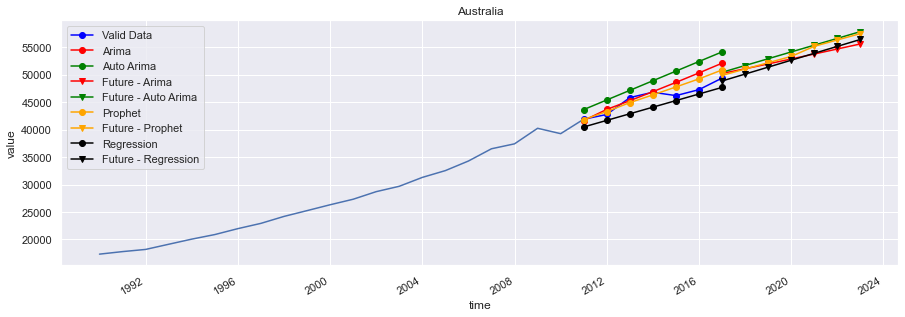

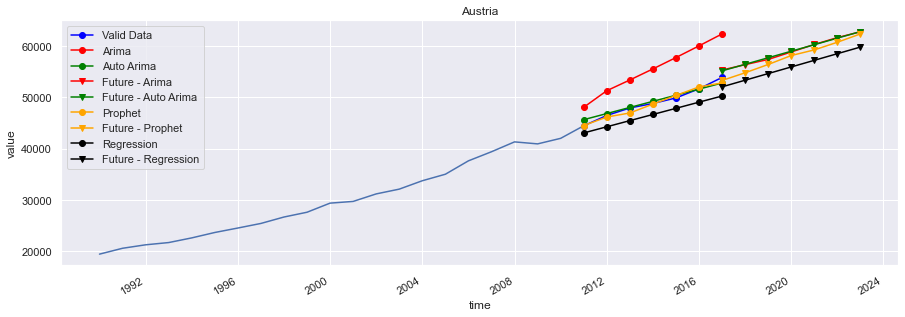

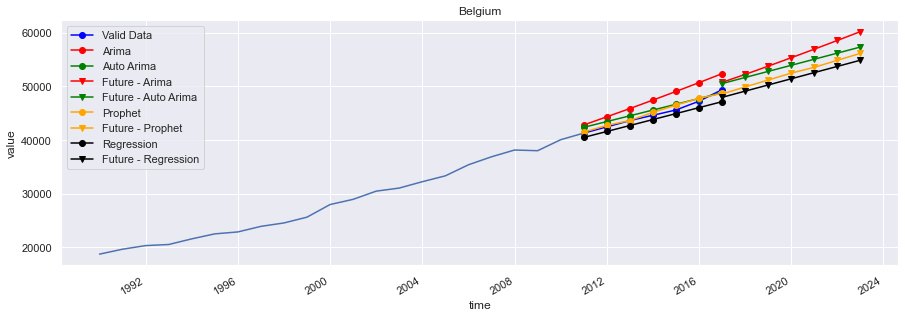

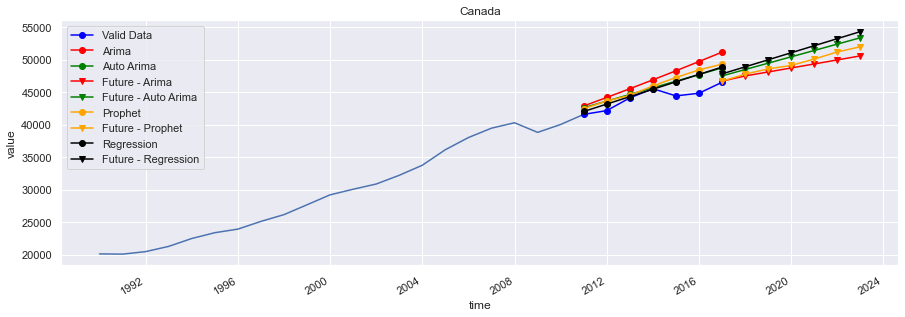

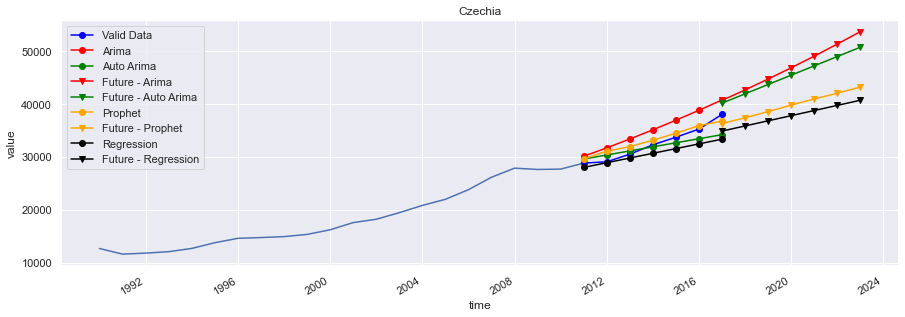

...

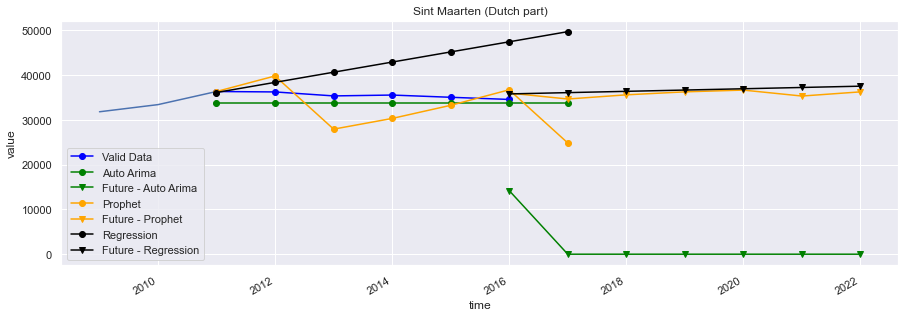

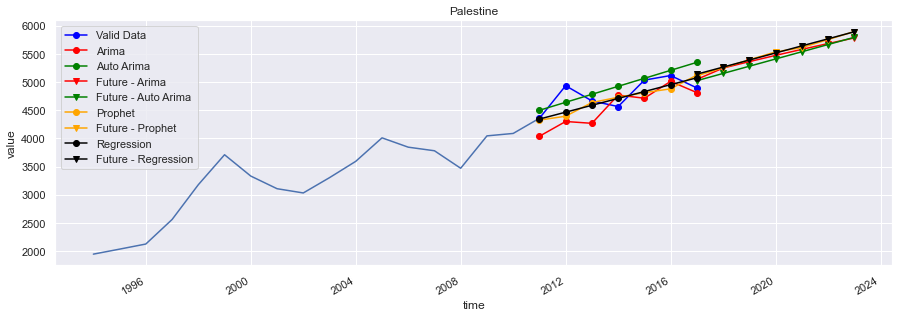

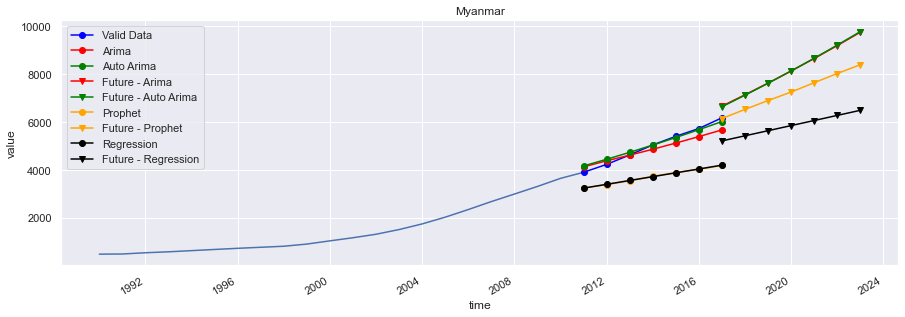

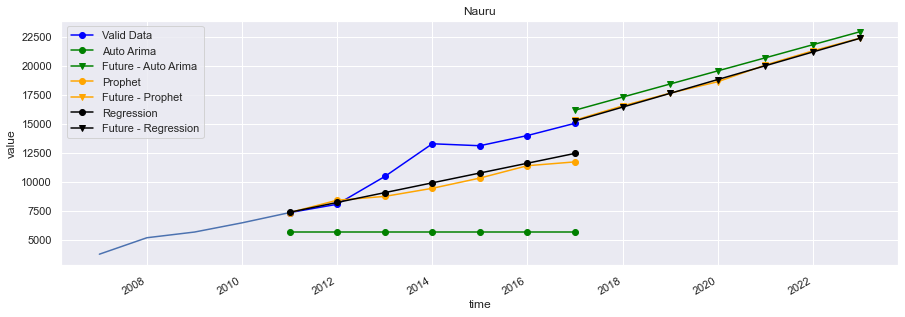

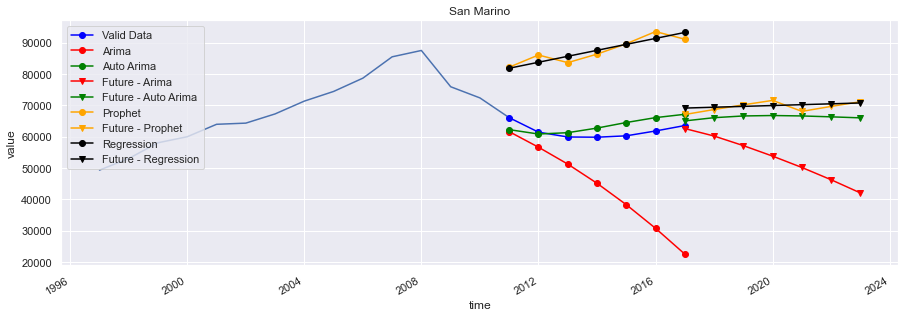

In [34]:
# Step 6 - FIXING SMALL ISSUES

# creating a country list
countries = forecast_data['country'].unique()

# Denmark gives an error
# Afghanistan gives an error

#countries = ['Democratic Republic of the Congo', 'Dominica']

try:
    del final_forecasts
except:
    print('')

for c in countries:
    # filtering the train data
    print(c)
    train_data = X_train[X_train['country'] == c]
    train_data2 = train_data[['time', 'value']]
    
    # filtering the valid data
    valid_data = X_valid[X_valid['country'] == c]
    valid_data2 = valid_data[['time', 'value']]
    
    # all data
    all_data = forecast_data[forecast_data['country']==c]
    all_data2 = all_data[['time', 'value']]
    
    #convert date column to datetime
    train_data2.set_index('time', inplace=True)
    valid_data2.set_index('time', inplace=True)
    valid_data2.columns = ['Valid Data']    
    all_data2.set_index('time', inplace=True)
    

    # Setting the Valid - Index for 6 years
    index_7_years = pd.date_range(train_data2.index[-1], freq='AS', periods = 7) 
    
    # Setting the Future - Index for 6 years
    future_index_7_years = pd.date_range(valid_data2.index[-1], freq='AS', periods = 7) 
    
    # Dropping all tables
    try:
        del t_fcast1
        del t_fcast2
        del t_fcast3
        del t_fcast4
        
        del f_fcast1
        del f_fcast2
        del f_fcast3 
        del f_fcast4
        
    except:
        print("")

    try:
        del df_fcast1
        del df_fcast2
        del df_fcast3
        del df_fcast4
    except:
        print("")
        
    ##############################################################################################################
    ######################################            ARIMA             ##########################################  
    ##############################################################################################################
    
    # THIS IS FOR THE VALIDATION PHASE 
    try:        
        try:
            # Running ARIMA on Best parameter
            model_arima = ARIMA(train_data2, order=(0,2,3))
            model_arima_fit = model_arima.fit(disp=-1)

            # Saving ARIMA predictions
            t_fcast1 = model_arima_fit.forecast(7)[0]
            # Passing the same index as the others
            t_fcast1 = pd.Series(t_fcast1, index=index_7_years)
            t_fcast1 = t_fcast1.rename("Arima") 
        except:
            # Running ARIMA on Best parameter
            model_arima = ARIMA(train_data2, order=(4,1,0))
            model_arima_fit = model_arima.fit(disp=-1)

            # Saving ARIMA predictions
            t_fcast1 = model_arima_fit.forecast(7)[0]
            # Passing the same index as the others
            t_fcast1 = pd.Series(t_fcast1, index=index_7_years)
            t_fcast1 = t_fcast1.rename("Arima") 
    except:
        print(c, "Arima Train Error")
        
     # THIS IS FOR THE FUTURE PHASE
    try:        
        try:
            # Running ARIMA on Best parameter
            model_arima = ARIMA(all_data2, order=(0,2,3))
            model_arima_fit = model_arima.fit(disp=-1)

            # Saving ARIMA predictions
            f_fcast1 = model_arima_fit.forecast(7)[0]
            # Passing the same index as the others
            f_fcast1 = pd.Series(f_fcast1, index=future_index_7_years)
            f_fcast1 = f_fcast1.rename("Future - Arima") 
        except:
            # Running ARIMA on Best parameter
            model_arima = ARIMA(all_data2, order=(4,1,0))
            model_arima_fit = model_arima.fit(disp=-1)

            # Saving ARIMA predictions
            f_fcast1 = model_arima_fit.forecast(7)[0]
            # Passing the same index as the others
            f_fcast1 = pd.Series(f_fcast1, index=future_index_7_years)
            f_fcast1 = f_fcast1.rename("Future - Arima") 
    except:
        print(c, "Arima Future Error")   
        
    ##############################################################################################################
    ######################################      AUTO - ARIMA             ######################################### 
    ##############################################################################################################
    
    # THIS IS FOR THE VALIDATION PHASE
    try:
        # Running auto ARIMA 
        auto_arima_model = pm.auto_arima(train_data2, seasonal=False, m=7)

        # make your forecasts
        t_fcast2 = auto_arima_model.predict(7) 
        t_fcast2 = pd.Series(t_fcast2, index=index_7_years)
        t_fcast2 = t_fcast2.rename("Auto Arima")

    except:
        print(c, "Auto Arima Train Error") 
        
     # THIS IS FOR THE FUTURE PHASE
    try:
        # Running auto ARIMA Future
        auto_arima_model = pm.auto_arima(all_data2, seasonal=False, m=7)

        # make your forecasts
        f_fcast2 = auto_arima_model.predict(7) 
        f_fcast2 = pd.Series(f_fcast2, index=future_index_7_years)
        f_fcast2 = f_fcast2.rename("Future - Auto Arima")

    except:
        print(c, "Auto Arima Train Error")  

    ##############################################################################################################
    ######################################      PROPHET             ############################################## 
    ##############################################################################################################
    
    # prepare expected column names
    train_data3 = train_data.copy()
    train_data3 = train_data3[['time', 'value']]
    train_data3.columns = ['ds', 'y']
    train_data3['ds']= to_datetime(train_data3['ds'])
    
    all_data3 = all_data.copy()
    all_data3 = all_data3[['time', 'value']]
    all_data3.columns = ['ds', 'y']
    all_data3['ds']= to_datetime(all_data3['ds'])

    # define the period for which we want a prediction - Valid
    v_df_index_7_years = pd.DataFrame(index_7_years)
    v_df_index_7_years.columns = ['ds']
    v_df_index_7_years['ds']= to_datetime(v_df_index_7_years['ds'])

    # define the period for which we want a prediction - Future
    f_df_index_7_years = pd.DataFrame(future_index_7_years)
    f_df_index_7_years.columns = ['ds']
    f_df_index_7_years['ds']= to_datetime(f_df_index_7_years['ds'])
    
    ############### THIS IS FOR THE VALIDATION PHASE  ##################

    # define the model
    model = Prophet()
    # fit the model
    model.fit(train_data3)

    # use the model to make a forecast
    t_fcast3 = model.predict(v_df_index_7_years)
    t_fcast3 = pd.Series(t_fcast3['yhat'].values, index=index_7_years)
    t_fcast3 = t_fcast3.rename("Prophet")
    
    ############### THIS IS FOR THE VALIDATION PHASE  ##################

    # define the model
    model2 = Prophet()
    # fit the model
    model2.fit(all_data3)

    # use the model to make a forecast
    f_fcast3 = model2.predict(f_df_index_7_years)
    f_fcast3 = pd.Series(f_fcast3['yhat'].values, index=future_index_7_years)
    f_fcast3 = f_fcast3.rename("Future - Prophet")  

    ##############################################################################################################
    ########################################         Regression         ##########################################
    ##############################################################################################################
    
    # Creating Ordinal Dates
    train_data['MonthNumberOrdinal'] = train_data['time']
    train_data['MonthNumberOrdinal'] = pd.to_datetime(train_data['MonthNumberOrdinal']).map(datetime.toordinal)

    all_data['MonthNumberOrdinal'] = all_data['time']
    all_data['MonthNumberOrdinal'] = pd.to_datetime(all_data['MonthNumberOrdinal']).map(datetime.toordinal)

    # adding the ordinal dates to the prediction dates
    v_df_index_7_years['ForecastDate_Ordinal'] = pd.to_datetime(v_df_index_7_years['ds']).map(datetime.toordinal)
    f_df_index_7_years['ForecastDate_Ordinal'] = pd.to_datetime(f_df_index_7_years['ds']).map(datetime.toordinal)


    # Fitting LR on Valid
    reg = linear_model.LinearRegression()
    reg.fit(train_data['MonthNumberOrdinal'].values.reshape(-1, 1), train_data['value'].values)

    # Making predictions
    t_fcast4 = reg.predict(v_df_index_7_years['ForecastDate_Ordinal'].values.reshape(-1, 1))

    # Passing the same index as the others
    t_fcast4 = pd.Series(t_fcast4, index=index_7_years)
    t_fcast4 = t_fcast4.rename("Regression")

    # Fitting LR on Future
    reg2 = linear_model.LinearRegression()
    reg2.fit(all_data['MonthNumberOrdinal'].values.reshape(-1, 1), all_data['value'].values)

    # Making predictions
    f_fcast4 = reg2.predict(f_df_index_7_years['ForecastDate_Ordinal'].values.reshape(-1, 1))

    # Passing the same index as the others
    f_fcast4 = pd.Series(f_fcast4, index=future_index_7_years)
    f_fcast4 = f_fcast4.rename("Future - Regression")
    
    ##############################################################################################################
    ########################################      SAVING THE MSE        ##########################################
    ##############################################################################################################
    try:
        t_fcast1_mse = mean_squared_error(valid_data['value'].values, t_fcast1.values, squared=False)
    except:
        t_fcast1_mse = 0
    try:
        t_fcast2_mse = mean_squared_error(valid_data['value'].values, t_fcast2.values, squared=False)
    except:
        t_fcast2_mse = 0
    try:
        t_fcast3_mse = mean_squared_error(valid_data['value'].values, t_fcast3.values, squared=False)
    except:
        t_fcast3_mse = 0
    try:
        t_fcast4_mse = mean_squared_error(valid_data['value'].values, t_fcast4.values, squared=False)
    except:
        t_fcast4_mse = 0
    
    ##############################################################################################################
    ########################################      PLOTTING              ##########################################
    ##############################################################################################################
    
    fig, ax = plt.subplots(figsize=(15,5))
    chart = sns.lineplot(x='time', y='value', data = train_data)
    chart.set_title(c)
    valid_data2.plot(ax=ax, color='blue', marker="o", legend=True)
    # ploting validation
    try:
        t_fcast1.plot(ax=ax, color='red', marker="o", legend=True)
    except:
        print("")        
    try:
        t_fcast2.plot(ax=ax, color='green', marker="o", legend=True)
    except:
        print("")
        
    # plotting future
    try:
        f_fcast1.plot(ax=ax, color='red', marker="v", legend=True)
    except:
        print("")        
    try:
        f_fcast2.plot(ax=ax, color='green', marker="v", legend=True)
    except:
        print("") 
    
    t_fcast3.plot(ax=ax, color='orange', marker="o", legend=True)
    f_fcast3.plot(ax=ax, color='orange', marker="v", legend=True)
    
    t_fcast4.plot(ax=ax, color='black', marker="o", legend=True)
    f_fcast4.plot(ax=ax, color='black', marker="v", legend=True)  
        
    ##############################################################################################################
    ########################################      SAVING THE RESULTS     #########################################
    ##############################################################################################################
    
    try:
        # Creating a DF for fcast1
        t_fcast1 = t_fcast1.reset_index()
        t_fcast1.columns = ['Date','Arima ForecastValue Validation']

        f_fcast1 = f_fcast1.reset_index()
        f_fcast1.columns = ['Date','Arima ForecastValue Future']

        # Creating the extra columns
        t_fcast1['Arima ForecastValue Future'] = np.nan
        f_fcast1['Arima ForecastValue Validation'] = np.nan

        # reordering 1 only
        t_fcast1 = t_fcast1[['Date','Arima ForecastValue Future','Arima ForecastValue Validation']]

        # Joining them together
        df_fcast1 = pd.concat([t_fcast1, f_fcast1], axis=0)
        df_fcast1['Country'] = c
        df_fcast1['ML Method'] = 'Arima'
        df_fcast1['Arima MSE'] = t_fcast1_mse
    
    except:
        df_fcast1 = pd.DataFrame({'Date': [np.nan], 'Arima ForecastValue Future': [np.nan],'Arima ForecastValue Validation': [np.nan], 'Country':[c], 'ML Method':['Arima'], 'Arima MSE':[np.nan]})

    try:
        # Creating a DF for fcast2
        t_fcast2 = t_fcast2.reset_index()
        t_fcast2.columns = ['Date','Auto-Arima ForecastValue Validation']

        f_fcast2 = f_fcast2.reset_index()
        f_fcast2.columns = ['Date','Auto-Arima ForecastValue Future']

        # Creating the extra columns
        t_fcast2['Auto-Arima ForecastValue Future'] = np.nan
        f_fcast2['Auto-Arima ForecastValue Validation'] = np.nan

        # reordering 1 only
        t_fcast2 = t_fcast2[['Date','Auto-Arima ForecastValue Future','Auto-Arima ForecastValue Validation']]

        # Joining them together
        df_fcast2 = pd.concat([t_fcast2, f_fcast2], axis=0)
        df_fcast2['Country'] = c
        df_fcast2['ML Method'] = 'Auto-Arima'
        df_fcast2['Auto-Arima MSE'] = t_fcast2_mse
    
    except:
        df_fcast2 = pd.DataFrame({'Date': [np.nan], 'Auto-Arima ForecastValue Future': [np.nan],'Auto-Arima ForecastValue Validation': [np.nan], 'Country':[c], 'ML Method':['Auto-Arima'], 'Auto-Arima MSE':[np.nan]})
        
    try:
        # Creating a DF for fcast3
        t_fcast3 = t_fcast3.reset_index()
        t_fcast3.columns = ['Date','Prophet ForecastValue Validation']

        f_fcast3 = f_fcast3.reset_index()
        f_fcast3.columns = ['Date','Prophet ForecastValue Future']

        # Creating the extra columns
        t_fcast3['Prophet ForecastValue Future'] = np.nan
        f_fcast3['Prophet ForecastValue Validation'] = np.nan

        # reordering 1 only
        t_fcast3 = t_fcast3[['Date','Prophet ForecastValue Future','Prophet ForecastValue Validation']]

        # Joining them together
        df_fcast3 = pd.concat([t_fcast3, f_fcast3], axis=0)
        df_fcast3['Country'] = c
        df_fcast3['ML Method'] = 'Prophet'
        df_fcast3['Prophet MSE'] = t_fcast3_mse
    
    except:
        df_fcast3 = pd.DataFrame({'Date': [np.nan], 'Prophet ForecastValue Future': [np.nan],'Prophet ForecastValue Validation': [np.nan], 'Country':[c], 'ML Method':['Prophet'], 'Prophet MSE':[np.nan]})
        
    try:
        # Creating a DF for fcast4
        t_fcast4 = t_fcast4.reset_index()
        t_fcast4.columns = ['Date','Regression ForecastValue Validation']

        f_fcast4 = f_fcast4.reset_index()
        f_fcast4.columns = ['Date','Regression ForecastValue Future']

        # Creating the extra columns
        t_fcast4['Regression ForecastValue Future'] = np.nan
        f_fcast4['Regression ForecastValue Validation'] = np.nan

        # reordering 1 only
        t_fcast4 = t_fcast4[['Date','Regression ForecastValue Future','Regression ForecastValue Validation']]

        # Joining them together
        df_fcast4 = pd.concat([t_fcast4, f_fcast4], axis=0)
        df_fcast4['Country'] = c
        df_fcast4['ML Method'] = 'Regression'
        df_fcast4['Regression MSE'] = t_fcast4_mse
        df_fcast4['Regression Slope'] = reg2.coef_[0]
        df_fcast4['Regression Trend Direction'] = np.where(df_fcast4['Regression Slope']<=0, 'Negative Trend', 'Positive Trend')
        df_fcast4['Regression Slope Monthly Change Proj'] = df_fcast4['Regression ForecastValue Future'].iloc[-1] - df_fcast4['Regression ForecastValue Future'].iloc[-2]
    
    except:
        df_fcast4 = pd.DataFrame({'Date': [np.nan], 'Regression ForecastValue Future': [np.nan],'Regression ForecastValue Validation': [np.nan], 'Country':[c], 'ML Method':['Regression'], 'Regression MSE':[np.nan], 'Regression Slope':[np.nan], 'Regression Trend Direction':[np.nan], 'Regression Slope Monthly Change Proj':[np.nan]})
        
    # Aggregating the data to avoid duplication
    df_fcast1 = df_fcast1.groupby(['Date', 'Country','ML Method'], as_index = False).agg({'Arima ForecastValue Future':'sum','Arima ForecastValue Validation':'sum','Arima MSE':'max'})
    df_fcast2 = df_fcast2.groupby(['Date', 'Country','ML Method'], as_index = False).agg({'Auto-Arima ForecastValue Future':'sum','Auto-Arima ForecastValue Validation':'sum','Auto-Arima MSE':'max'})
    df_fcast3 = df_fcast3.groupby(['Date', 'Country','ML Method'], as_index = False).agg({'Prophet ForecastValue Future':'sum','Prophet ForecastValue Validation':'sum','Prophet MSE':'max'})
    df_fcast4 = df_fcast4.groupby(['Date', 'Country','ML Method', 'Regression Trend Direction'], as_index = False).agg({'Regression ForecastValue Future':'sum','Regression ForecastValue Validation':'sum','Regression MSE':'max','Regression Slope':'max','Regression Slope Monthly Change Proj':'max'})

    # joining them all together
    all_forecasts = df_fcast1.merge(df_fcast2[['Date','Auto-Arima ForecastValue Future','Auto-Arima ForecastValue Validation', 'Auto-Arima MSE']], how = 'left', on ='Date')
    all_forecasts = all_forecasts.merge(df_fcast3[['Date','Prophet ForecastValue Future', 'Prophet ForecastValue Validation', 'Prophet MSE']], how = 'left', on ='Date')
    all_forecasts = all_forecasts.merge(df_fcast4[['Date','Regression ForecastValue Future', 'Regression ForecastValue Validation', 'Regression MSE', 'Regression Slope','Regression Slope Monthly Change Proj','Regression Trend Direction']], how = 'left', on ='Date')

    # Saving the predictions in a DF
    try:
        final_forecasts = pd.concat([final_forecasts, all_forecasts], ignore_index = True)
    except:
        final_forecasts = all_forecasts    

In [70]:
# Union-ing predictions with the original dataset 

#creating the needed columns
forecast_data['Arima ForecastValue Future'] = np.nan
forecast_data['Arima ForecastValue Validation'] = np.nan
forecast_data['Arima MSE'] = np.nan
forecast_data['Auto-Arima ForecastValue Future'] = np.nan
forecast_data['Auto-Arima ForecastValue Validation'] = np.nan
forecast_data['Auto-Arima MSE'] = np.nan
forecast_data['Prophet ForecastValue Future'] = np.nan
forecast_data['Prophet ForecastValue Validation'] = np.nan
forecast_data['Prophet MSE'] = np.nan
forecast_data['Regression ForecastValue Future'] = np.nan
forecast_data['Regression ForecastValue Validation'] = np.nan
forecast_data['Regression MSE'] = np.nan
forecast_data['Regression Slope'] = np.nan
forecast_data['Regression Slope Monthly Change Proj'] = np.nan
forecast_data['Regression Trend Direction'] = np.nan

forecast_data = forecast_data.rename({'time': 'Date', 'country':'Country'}, axis=1)

del final_forecasts['ML Method']

final_forecasts['value'] = np.nan



In [73]:

# Reordering final_forecasts

final_forecasts = final_forecasts[['Country', 'Date', 'value', 'Arima ForecastValue Future',
       'Arima ForecastValue Validation', 'Arima MSE',
       'Auto-Arima ForecastValue Future',
       'Auto-Arima ForecastValue Validation', 'Auto-Arima MSE',
       'Prophet ForecastValue Future', 'Prophet ForecastValue Validation',
       'Prophet MSE', 'Regression ForecastValue Future',
       'Regression ForecastValue Validation', 'Regression MSE',
       'Regression Slope', 'Regression Slope Monthly Change Proj',
       'Regression Trend Direction']]

# Union
output_df = pd.concat([forecast_data, final_forecasts], axis=0)

In [75]:
output_df.tail()

,Country,Date,value,Arima ForecastValue Future,Arima ForecastValue Validation,Arima MSE,Auto-Arima ForecastValue Future,Auto-Arima ForecastValue Validation,Auto-Arima MSE,Prophet ForecastValue Future,Prophet ForecastValue Validation,Prophet MSE,Regression ForecastValue Future,Regression ForecastValue Validation,Regression MSE,Regression Slope,Regression Slope Monthly Change Proj,Regression Trend Direction
2387,San Marino,2019-01-01,NaN,57139.294349,0.0,22234.856525,66597.360893,0.0,3259.183362,70146.605173,0.0,26057.372361,69654.950079,0.0,26129.42116,0.743395,271.339198,Positive Trend
2388,San Marino,2020-01-01,NaN,53794.873176,0.0,22234.856525,66739.944745,0.0,3259.183362,71560.236419,0.0,26057.372361,69926.289278,0.0,26129.42116,0.743395,271.339198,Positive Trend
2389,San Marino,2021-01-01,NaN,50164.312880,0.0,22234.856525,66602.780836,0.0,3259.183362,68063.086074,0.0,26057.372361,70198.371871,0.0,26129.42116,0.743395,271.339198,Positive Trend
2390,San Marino,2022-01-01,NaN,46247.613461,0.0,22234.856525,66317.463118,0.0,3259.183362,69645.766611,0.0,26057.372361,70469.711069,0.0,26129.42116,0.743395,271.339198,Positive Trend
2391,San Marino,2023-01-01,NaN,42044.774919,0.0,22234.856525,65994.667176,0.0,3259.183362,71144.684663,0.0,26057.372361,70741.050267,0.0,26129.42116,0.743395,271.339198,Positive Trend


In [76]:
# Setting zeros to np.nan for Power BI

output_df['Arima ForecastValue Future'][output_df['Arima ForecastValue Future'] < 1] = np.nan
output_df['Arima ForecastValue Validation'][output_df['Arima ForecastValue Validation'] < 1] = np.nan
output_df['Arima MSE'][output_df['Arima MSE'] < 1] = np.nan
output_df['Auto-Arima ForecastValue Future'][output_df['Auto-Arima ForecastValue Future'] < 1] = np.nan
output_df['Auto-Arima ForecastValue Validation'][output_df['Auto-Arima ForecastValue Validation'] < 1] = np.nan
output_df['Auto-Arima MSE'][output_df['Auto-Arima MSE'] < 1] = np.nan
output_df['Prophet ForecastValue Future'][output_df['Prophet ForecastValue Future'] < 1] = np.nan
output_df['Prophet ForecastValue Validation'][output_df['Prophet ForecastValue Validation'] < 1] = np.nan
output_df['Prophet MSE'][output_df['Prophet MSE'] < 1] = np.nan
output_df['Regression ForecastValue Future'][output_df['Regression ForecastValue Future'] < 1] = np.nan
output_df['Regression ForecastValue Validation'][output_df['Regression ForecastValue Validation'] < 1] = np.nan
output_df['Regression MSE'][output_df['Regression MSE'] < 1] = np.nan
output_df['Regression Slope'][output_df['Regression Slope'] < 1] = np.nan
output_df['Regression Slope Monthly Change Proj'][output_df['Regression Slope Monthly Change Proj'] < 1] = np.nan
#output_df['Regression Trend Direction'][output_df['Regression Trend Direction'] < 1] = np.nan

### 10.1 Exporting/Writing data back to SQL

In [77]:
# Exporting this data back to a New Table in SQL
from sqlalchemy import create_engine
import urllib

quoted = urllib.parse.quote_plus("Driver={SQL Server Native Client 11.0};"
                     "Server=DESKTOP-8L98FK0\MSSQLSERVER09;"
                     "Database=Data360YP;"
                     "Trusted_Connection=yes;")

engine = create_engine('mssql+pyodbc:///?odbc_connect={}'.format(quoted))

output_df.to_sql('Time Series Forecast GDP', schema='dbo', con = engine, if_exists = 'replace')

### 10.2 Exporting/Writing data to CSV

In [78]:
# Exporting the data in a CSV
output_df.to_csv('Time Series Forecast GDP', sep='\t')

os. getcwd() 

'C:\\Users\\pitsi\\Desktop\\Python Tutorials\\Time Series Models'